# Projet python William, Subina et Cécilia DIA 6

#### Importations des bibliothèques nécessaires

In [102]:
import pandas as pd
import plotly.express as px
import plotly.graph_objs as go
import seaborn as sns
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import numpy as np
import warnings
warnings.filterwarnings("ignore")

### Importation du dataframe online_shoppers_intention

In [103]:
df = pd.read_csv("online_shoppers_intention.csv")
df2 = df.copy()
df

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3,3,1,4,Returning_Visitor,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4,6,1,1,Returning_Visitor,True,False
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3,2,1,8,Returning_Visitor,True,False
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3,2,1,13,Returning_Visitor,True,False
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2,2,3,11,Returning_Visitor,False,False


### Commençons par nettoyer le dataframe

In [104]:
df.info

<bound method DataFrame.info of        Administrative  Administrative_Duration  Informational  \
0                   0                      0.0              0   
1                   0                      0.0              0   
2                   0                      0.0              0   
3                   0                      0.0              0   
4                   0                      0.0              0   
...               ...                      ...            ...   
12325               3                    145.0              0   
12326               0                      0.0              0   
12327               0                      0.0              0   
12328               4                     75.0              0   
12329               0                      0.0              0   

       Informational_Duration  ProductRelated  ProductRelated_Duration  \
0                         0.0               1                 0.000000   
1                         0.0          

In [105]:
df.columns

Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay', 'Month',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'VisitorType',
       'Weekend', 'Revenue'],
      dtype='object')

In [106]:
df.dtypes

Administrative               int64
Administrative_Duration    float64
Informational                int64
Informational_Duration     float64
ProductRelated               int64
ProductRelated_Duration    float64
BounceRates                float64
ExitRates                  float64
PageValues                 float64
SpecialDay                 float64
Month                       object
OperatingSystems             int64
Browser                      int64
Region                       int64
TrafficType                  int64
VisitorType                 object
Weekend                       bool
Revenue                       bool
dtype: object

### Observons s'il y a des données sans valeur

In [107]:
df.isnull().sum()

Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
Revenue                    0
dtype: int64

**On constate qu'il n'y a pas de valeur null**

### Maintenant vérifions s'il n'y pas de valeurs négatives

In [108]:
colonnes_numeric = ['Administrative',
 'Administrative_Duration',
 'Informational',
 'Informational_Duration',
 'ProductRelated',
 'ProductRelated_Duration',
 'BounceRates',
 'ExitRates',
 'PageValues',
 'SpecialDay',
 'TrafficType']

for i in range(len(colonnes_numeric)):
    print(df[df[colonnes_numeric[i]].astype(float) < 0])

Empty DataFrame
Columns: [Administrative, Administrative_Duration, Informational, Informational_Duration, ProductRelated, ProductRelated_Duration, BounceRates, ExitRates, PageValues, SpecialDay, Month, OperatingSystems, Browser, Region, TrafficType, VisitorType, Weekend, Revenue]
Index: []
Empty DataFrame
Columns: [Administrative, Administrative_Duration, Informational, Informational_Duration, ProductRelated, ProductRelated_Duration, BounceRates, ExitRates, PageValues, SpecialDay, Month, OperatingSystems, Browser, Region, TrafficType, VisitorType, Weekend, Revenue]
Index: []
Empty DataFrame
Columns: [Administrative, Administrative_Duration, Informational, Informational_Duration, ProductRelated, ProductRelated_Duration, BounceRates, ExitRates, PageValues, SpecialDay, Month, OperatingSystems, Browser, Region, TrafficType, VisitorType, Weekend, Revenue]
Index: []
Empty DataFrame
Columns: [Administrative, Administrative_Duration, Informational, Informational_Duration, ProductRelated, Produ

**Toutes les listes sont vides : il n'y pas de valeurs négatives**

### Pour finir, changeons un peu le dataset afin que certains valeurs correspondent à des choses concrètes

In [109]:
df['Month'].unique()

array(['Feb', 'Mar', 'May', 'Oct', 'June', 'Jul', 'Aug', 'Nov', 'Sep',
       'Dec'], dtype=object)

In [110]:
df['OperatingSystems'].unique()

array([1, 2, 4, 3, 7, 6, 8, 5], dtype=int64)

In [111]:
df['TrafficType'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 18, 19,
       16, 17, 20], dtype=int64)

In [112]:
df['Region'].unique()

array([1, 9, 2, 3, 4, 5, 6, 7, 8], dtype=int64)

In [113]:
df['Browser'].unique()

array([ 1,  2,  3,  4,  5,  6,  7, 10,  8,  9, 12, 13, 11], dtype=int64)

In [114]:
df['VisitorType'].unique()

array(['Returning_Visitor', 'New_Visitor', 'Other'], dtype=object)

In [115]:
Region = ['France', 'Malaisie', 'Italie', 'Espagne', 'Allemagne', 'Angleterre', 'Pologne', 'Colombie', 'Roumanie']
Browser = ['Chrome', 'Duckduckgo', 'Mozilla Firefox', 'Microsoft Edge', 'Safari', 'Vivaldi', 'Opera', 'TOR Browser', 'Maxthon', 'Torch Browser', 'UC Browser', 'Avast Secure Browser', 'Chromium Browser']
OperatingSystems = ['Windows', 'MacOS', 'IOS', 'Android', 'GNU', 'Linux', 'Unix', 'RTX']

In [116]:
df['SpecialDay'].unique()

array([0. , 0.4, 0.8, 1. , 0.2, 0.6])

In [117]:
df[df['SpecialDay'] == 1].SpecialDay.value_counts()

SpecialDay
1.0    154
Name: count, dtype: int64

In [118]:
df['Region'] = df['Region'].astype(str)

In [119]:
df['Region'] = df['Region'].map({'1': 'Malaisie', '2' : 'Italie', '3' : 'Espagne', '4':'Allemagne', '5':'Angleterre', '6':'Pologne','7': 'Colombie','8': 'Roumanie', '9' : 'France'})

In [120]:
df['Browser'] = df['Browser'].astype(str)

In [121]:
df['Browser'] = df['Browser'].map({'1': 'Chrome', '2' : 'Duckduckgo', '3' : 'Mozilla Firefox', '4':'Microsoft Edge', '5':'Safari', '6':'Vivaldi','7': 'Opera','8': 'TOR Browser', '9' : 'Maxthon', '10' : 'Torch Browser', '11' : 'UC Browser', '12' : 'Avast Secure Browser', '13' : 'Chromium Browser'})

In [122]:
df['OperatingSystems'] = df['OperatingSystems'].astype(str)

In [123]:
df['OperatingSystems'] = df['OperatingSystems'].map({'1': 'Windows', '2' : 'MacOS', '3' : 'IOS', '4':'Android', '5':'GNU', '6':'Linux','7': 'Unix','8': 'RTX'})

In [124]:
df

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,Windows,Chrome,Malaisie,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,Feb,MacOS,Duckduckgo,Malaisie,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,Android,Chrome,France,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,Feb,IOS,Duckduckgo,Italie,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,Feb,IOS,Mozilla Firefox,Malaisie,4,Returning_Visitor,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,Android,Vivaldi,Malaisie,1,Returning_Visitor,True,False
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,Nov,IOS,Duckduckgo,Malaisie,8,Returning_Visitor,True,False
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,Nov,IOS,Duckduckgo,Malaisie,13,Returning_Visitor,True,False
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,Nov,MacOS,Duckduckgo,Espagne,11,Returning_Visitor,False,False


<h3>On va encoder Month, VisitorType et Weekend, afin d'avoir plus de variables et d'avoir de meilleurs résultats sur la matrice de corrélation et les modèles de machine learning (car les modèles utilisent des valeurs numériques)</h3>

In [125]:
# Encodage de la colonne "Month"
df2['Month'] = df2['Month'].map({'Feb': 0, 'Mar': 1, 'May': 2, 'June': 3, 'Jul': 4, 'Aug': 5, 'Sep': 6, 'Oct': 7, 'Nov': 8, 'Dec': 9})
df2['Month'] = df2['Month'].astype(int)

# Encodage de la colonne "VisitorType"
df2['VisitorType'] = df2['VisitorType'].map({'New_Visitor': 0, 'Returning_Visitor': 1, 'Other': 2})
df2['VisitorType'] = df2['VisitorType'].astype(int)

# Conversion de la colonne "Weekend" en 0 et 1
df2['Weekend'] = df2['Weekend'].astype(int)

# Conversion de la colonne "Revenue" en 0 et 1
df2['Revenue'] = df2['Revenue'].astype(int)

df2

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,0,1,1,1,1,1,0,0
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,0,2,2,1,2,1,0,0
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,0,4,1,9,3,1,0,0
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,0,3,2,2,4,1,0,0
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,0,3,3,1,4,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,9,4,6,1,1,1,1,0
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,8,3,2,1,8,1,1,0
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,8,3,2,1,13,1,1,0
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,8,2,2,3,11,1,0,0


### Regardons la matrice de corrélation

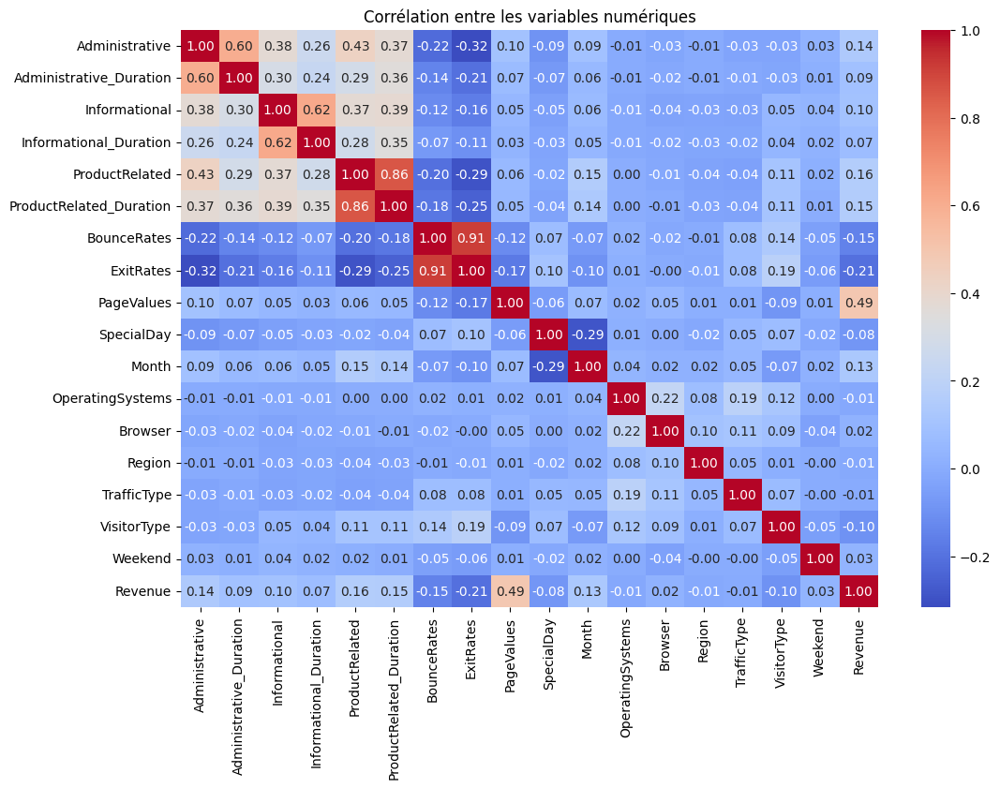

In [126]:
correlation_matrix = df2.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Corrélation entre les variables numériques')
plt.show()

**On constate que les variables dans l'ensemble sont peu corrélées à l'exception des visites des différents types de pages qui sont corrélées positivement entre elles surtout entre ProductRelated et ProductRelated_Duration, ce qui n'est pas étonnant. On constate que BonceRates (le taux de rebond est un indicateur marketing qui mesure le pourcentage d'internautes qui sont entrés sur une page Web et qui ont quitté le site après, sans consulter d'autres pages) et ExitRates sont extrêmements corrélées positivement ce qui est également cohérent.**

### Traçons un diagramme en bâton représentant le temps total passé par les visiteurs par type de page

Text(0, 0.5, 'Temps en secondes')

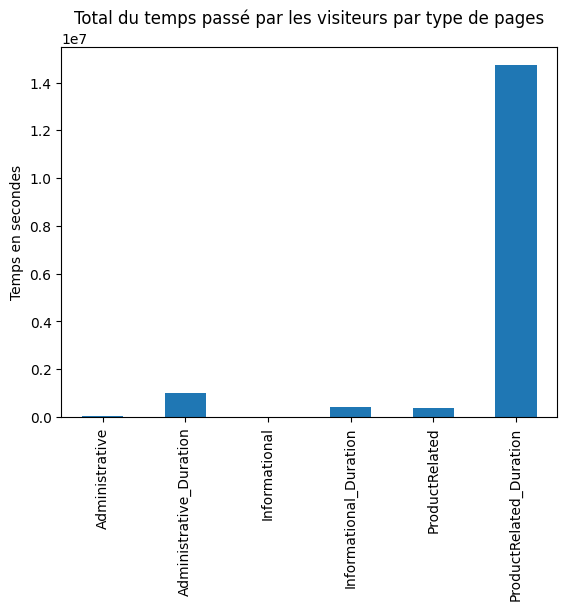

In [127]:
coucou = df[['Administrative', 'Administrative_Duration', 'Informational', 'Informational_Duration', 'ProductRelated', 
            'ProductRelated_Duration']]
nb_total_time_per_type_of_page = coucou.sum()
nb_total_time_per_type_of_page.plot(kind = 'bar')
plt.title("Total du temps passé par les visiteurs par type de pages")
plt.ylabel("Temps en secondes")

**On constate de façon flagrante que le type de page ProductRelated_Duration est le plus consulté par rapport aux autres et que les types de pages Administrative et Informational sont peu consultés comparés aux autres**

### Faisons le même travail avec la moyenne

Text(0, 0.5, 'Temps en secondes')

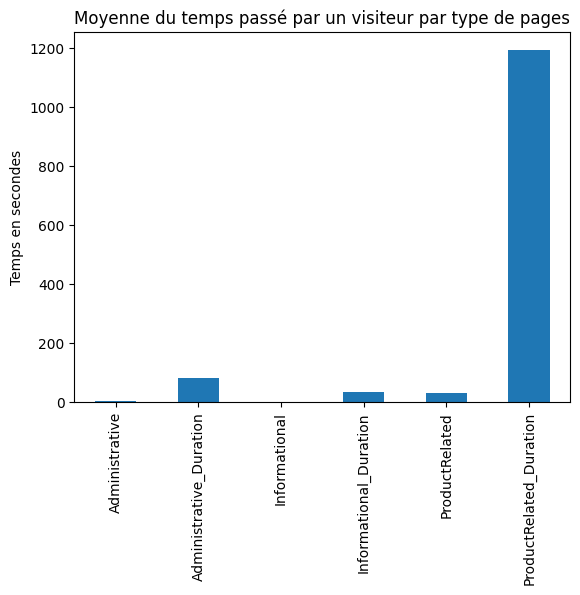

In [128]:
mean_time_per_type_of_page = coucou.mean()
mean_time_per_type_of_page.plot(kind = 'bar')
plt.title("Moyenne du temps passé par un visiteur par type de pages")
plt.ylabel("Temps en secondes")

**On obtient des résultats similaires que précédemment**

#### Supperposons les deux

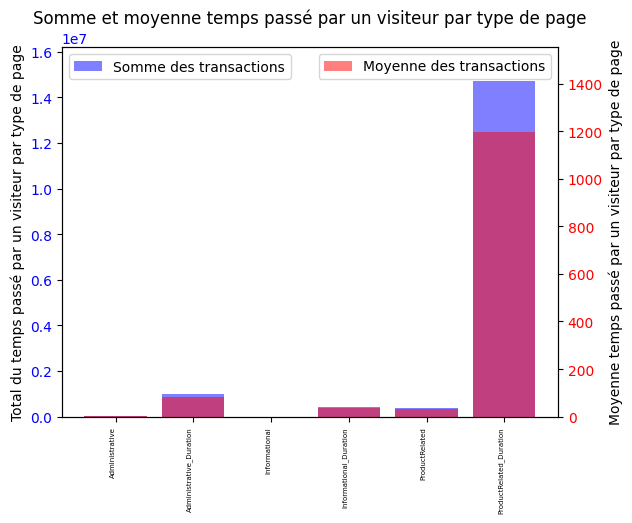

In [129]:
fig, ax1 = plt.subplots()

tick_positions = range(len(coucou.columns))
ax1.bar(nb_total_time_per_type_of_page.index, nb_total_time_per_type_of_page.values, alpha=0.5, color='blue', label='Somme des transactions')

ax1.set_ylabel('Total du temps passé par un visiteur par type de page')
ax1.tick_params(labelcolor='blue')
ax1.set_ylim([0,max(nb_total_time_per_type_of_page.values)*1.1])

ax2 = ax1.twinx()


ax2.bar(mean_time_per_type_of_page.index, mean_time_per_type_of_page.values, alpha=0.5, color='red', label='Moyenne des transactions')

ax2.set_ylabel('Moyenne temps passé par un visiteur par type de page')
ax2.tick_params(labelcolor='red')
ax2.set_ylim([0, max(mean_time_per_type_of_page.values)*1.3])

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

ax1.set_xticks(tick_positions)
ax1.set_xticklabels(coucou.columns, rotation=90, ha='right', color='black', fontsize = 5)

plt.title('Somme et moyenne temps passé par un visiteur par type de page')
plt.show()

### Traçons des courbes représentants la visite d'un type de site en fonction du mois puis supperposons ces courbes

### Rangeons les mois dans l'ordres

In [130]:
ordre = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'June', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

### Représentons dans un diagramme en bâton la répartition des visites en fonction des mois

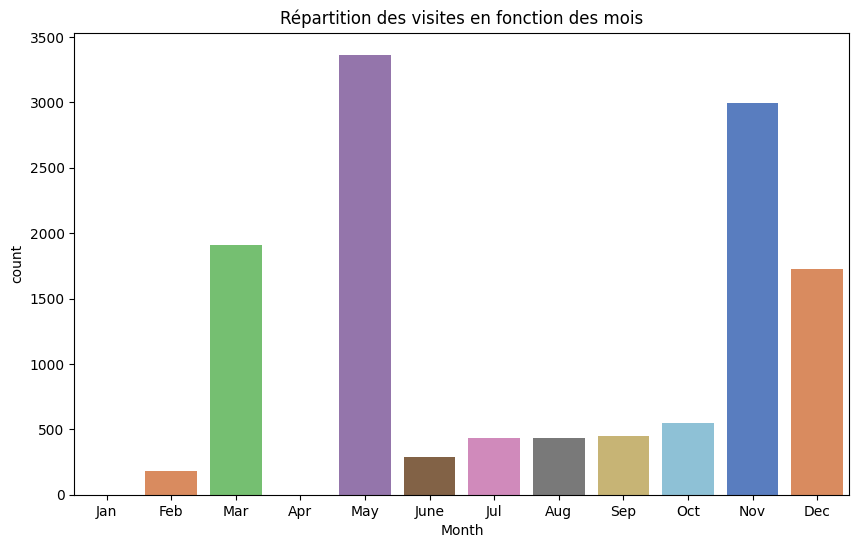

In [131]:
all_months_df = pd.DataFrame(index=ordre)
merged_df = pd.merge(all_months_df, df, left_index=True, right_on='Month', how='left')

plt.figure(figsize=(10, 6))
sns.countplot(x='Month',  hue='Month', data=merged_df, palette='muted', order=ordre)
plt.title('Répartition des visites en fonction des mois')
plt.show()

**On constate que les mois de Mars, Mai, Novembre et Décembre sont ceux qui détiennent le plus de visites. En revanche on constate également qu'il n'y a eu aucune visite en Janvier et Avril on peut donc pensé que durant ce mois le site était indispoible**

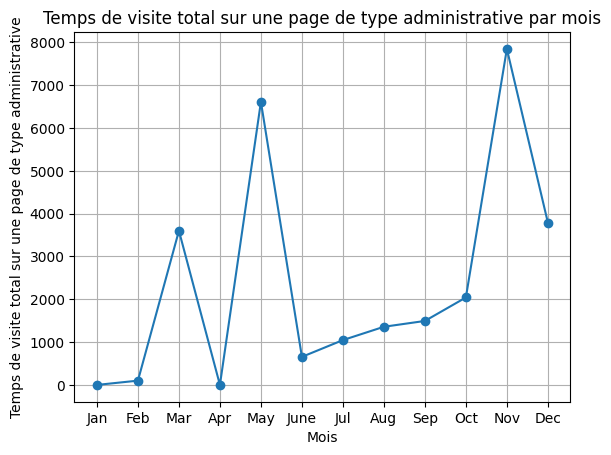

In [132]:
# Pour Administrative
Administrative = df[['Administrative', 'Month']]
Administrative = Administrative.groupby('Month').Administrative.sum().reindex(index=ordre, fill_value=0)

plt.plot(Administrative.index, Administrative.values, marker='o')
plt.xlabel('Mois')
plt.ylabel('Temps de visite total sur une page de type administrative')
plt.title('Temps de visite total sur une page de type administrative par mois')
plt.grid(True)
plt.show()

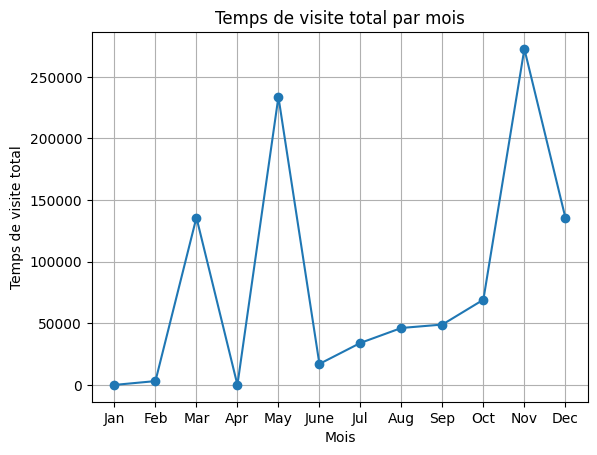

In [133]:
# Pour Administrative_Duration
Administrative_duration = df[['Administrative_Duration', 'Month']]
Administrative_duration = Administrative_duration.groupby('Month').Administrative_Duration.sum().reindex(index=ordre, fill_value=0)

plt.plot(Administrative_duration.index, Administrative_duration.values, marker='o')
plt.xlabel('Mois')
plt.ylabel('Temps de visite total')
plt.title('Temps de visite total par mois')
plt.grid(True)
plt.show()

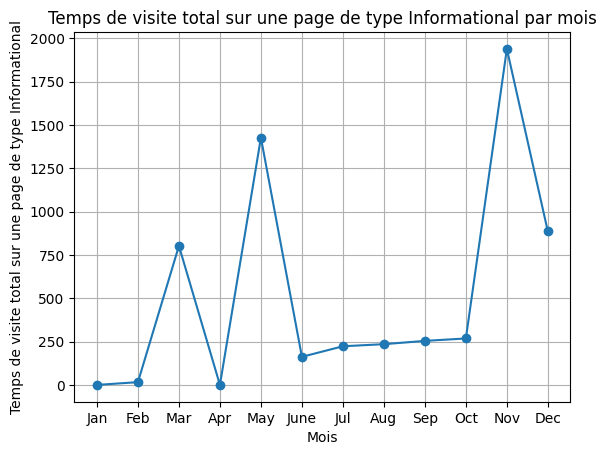

In [134]:
# Pour Informational
Informational = df[['Informational', 'Month']]
Informational = Informational.groupby('Month').Informational.sum().reindex(index=ordre, fill_value=0)

plt.plot(Informational.index, Informational.values, marker='o')
plt.xlabel('Mois')
plt.ylabel('Temps de visite total sur une page de type Informational')
plt.title('Temps de visite total sur une page de type Informational par mois')
plt.grid(True)
plt.show()

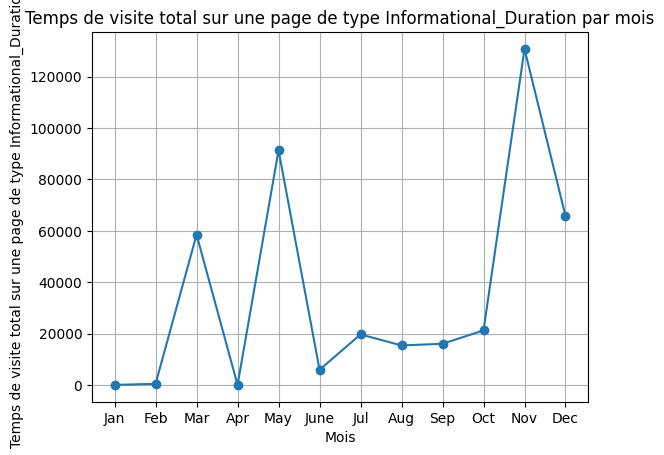

In [135]:
#Pour Informational_Duration

Informational_Duration = df[['Informational_Duration', 'Month']]
Informational_Duration = Informational_Duration.groupby('Month').Informational_Duration.sum().reindex(index=ordre, fill_value=0)

plt.plot(Informational_Duration.index, Informational_Duration.values, marker='o')
plt.xlabel('Mois')
plt.ylabel('Temps de visite total sur une page de type Informational_Duration')
plt.title('Temps de visite total sur une page de type Informational_Duration par mois')
plt.grid(True)

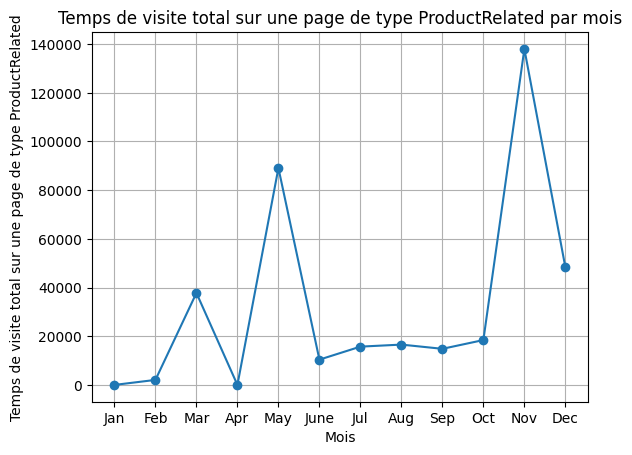

In [136]:
#Pour ProductRelated

ProductRelated = df[['ProductRelated', 'Month']]
ProductRelated = ProductRelated.groupby('Month').ProductRelated.sum().reindex(index=ordre, fill_value=0)

plt.plot(ProductRelated.index, ProductRelated.values, marker='o')
plt.xlabel('Mois')
plt.ylabel('Temps de visite total sur une page de type ProductRelated')
plt.title('Temps de visite total sur une page de type ProductRelated par mois')
plt.grid(True)

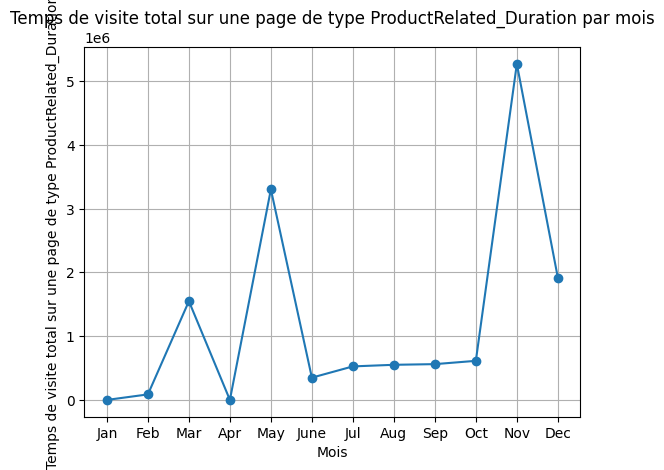

In [137]:
#Pour ProductRelated_Duration

ProductRelated_Duration = df[['ProductRelated_Duration', 'Month']]
ProductRelated_Duration = ProductRelated_Duration.groupby('Month').ProductRelated_Duration.sum().reindex(index=ordre, fill_value=0)

plt.plot(ProductRelated_Duration.index, ProductRelated_Duration.values, marker='o')
plt.xlabel('Mois')
plt.ylabel('Temps de visite total sur une page de type ProductRelated_Duration')
plt.title('Temps de visite total sur une page de type ProductRelated_Duration par mois')
plt.grid(True)

### Ces courbes ce ressemblent supperposons les pour voir les tendances

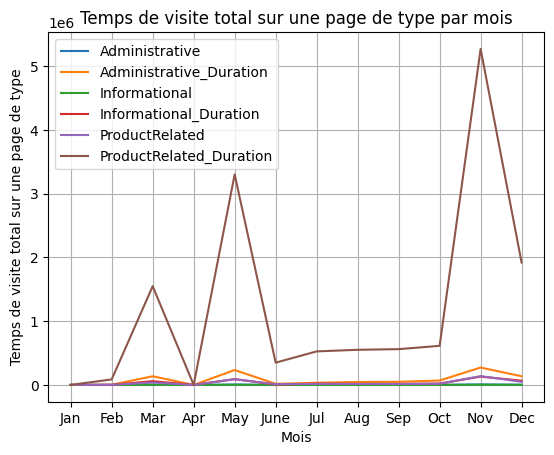

In [138]:
plt.plot(Administrative.index, Administrative.values, label = 'Administrative')
plt.plot(Administrative_duration.index, Administrative_duration.values, label = 'Administrative_Duration')
plt.plot(Informational.index, Informational.values, label = 'Informational')
plt.plot(Informational_Duration.index, Informational_Duration.values, label = 'Informational_Duration')
plt.plot(ProductRelated.index, ProductRelated.values, label = 'ProductRelated')
plt.plot(ProductRelated_Duration.index, ProductRelated_Duration.values, label = 'ProductRelated_Duration')
plt.xlabel('Mois')
plt.ylabel('Temps de visite total sur une page de type')
plt.title('Temps de visite total sur une page de type par mois')
plt.legend()
plt.grid(True)

**Les courbes semblent suivre les même tendances (les maximums locals se trouve au même endroit et les croissances et décroissances se font aussi au même endroit) ce qui n'est pas étonnant puisque le temps de visite dépend également du nombre de visite donc plus il y a de visite, plus le temps passé sur chaque type de page va augmenter et inversement. On constate qu'aux mois de Mars, Mai et Novembre il y a de fortes hausses.**

### Observons la répartition des operating systems

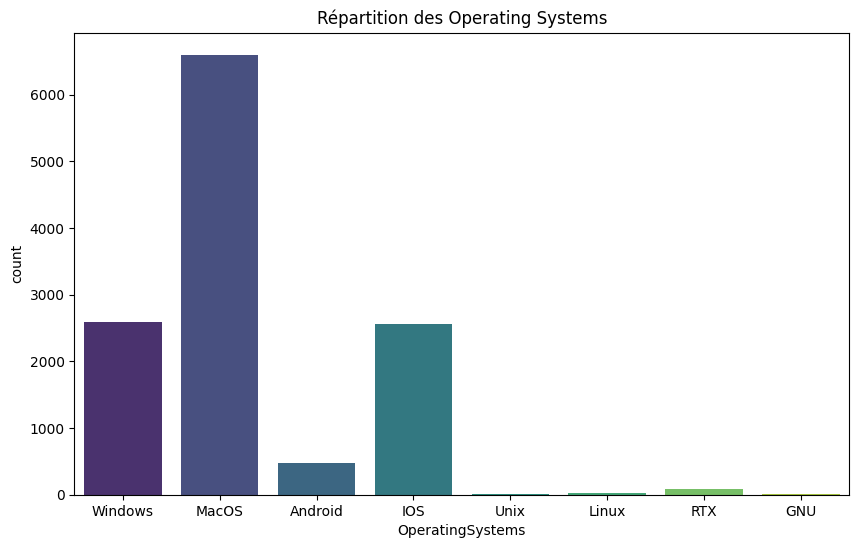

In [139]:
plt.figure(figsize=(10, 6))
sns.countplot(x='OperatingSystems', hue='OperatingSystems', data=df, palette='viridis')
plt.title('Répartition des Operating Systems')
plt.show()

**On constate que les MacOS, Widows et IOS sont les plus utilisées par les visiteurs et qu'au contraire, Unix, Linux, RTX et GNU sont les moins utilisées**

### Etudions maintenant le nombre de sessions en fonction des régions

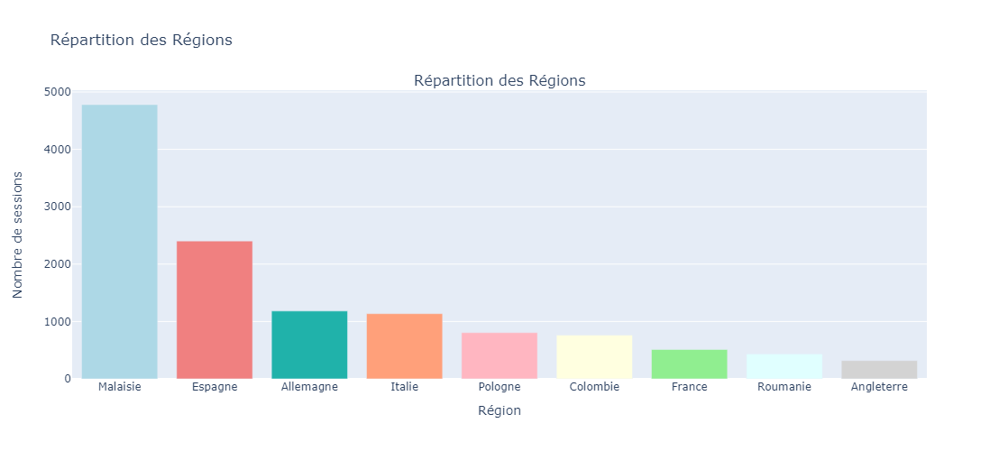

In [140]:
region_distribution = df['Region'].value_counts().reset_index()
region_distribution.columns = ['Region', 'Count']

colors = {'Malaisie': 'lightblue', 'France': 'lightgreen', 'Espagne': 'lightcoral', 'Italie': 'lightsalmon', 'Allemagne': 'lightseagreen', 'Pologne': 'lightpink', 'Colombie': 'lightyellow', 'Roumanie': 'lightcyan', 'Angleterre': 'lightgrey'}

fig = make_subplots(rows=1, cols=1, subplot_titles=['Répartition des Régions'])

for i, row in region_distribution.iterrows():
    fig.add_trace(go.Bar(x=[row['Region']], y=[row['Count']], marker=dict(color=colors.get(row['Region'], 'lightgray'))),
                  row=1, col=1)

fig.update_layout(title_text='Répartition des Régions', showlegend=False, height=500, width=800,
                  xaxis=dict(title='Région'), yaxis=dict(title='Nombre de sessions'))

fig.show()

**Les visiteurs sont principalement localisés en Malaisie, en Espagne, en Allemagne et en Italie**

### Maintenant observons la répartition des Browsers

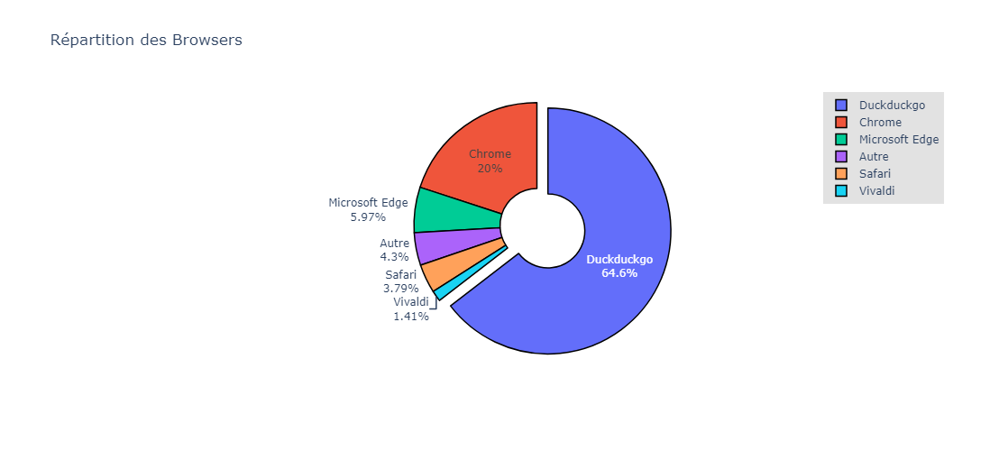

In [141]:
browser_distribution = df['Browser'].value_counts().reset_index()
browser_distribution.columns = ['Browser', 'Count']

threshold = 170
browser_distribution['Browser'] = browser_distribution['Browser'].where(browser_distribution['Count'] >= threshold, 'Autre')
browser_distribution = browser_distribution.groupby('Browser', as_index=False)['Count'].sum()

max_index = browser_distribution['Count'].idxmax()

fig = go.Figure()

fig.add_trace(go.Pie(labels=browser_distribution['Browser'], values=browser_distribution['Count'],
                     hole=0.3, textinfo='percent+label', marker=dict(line=dict(color='#000000', width=1.5)),
                     pull=[0.1 if i == max_index else 0 for i in range(len(browser_distribution))]))

fig.update_layout(title='Répartition des Browsers', showlegend=True, margin=dict(l=50, r=50, b=100, t=100), height=500,
                 legend=dict(x=1, y=1, traceorder='normal', font=dict(size=12), bgcolor='#E2E2E2', bordercolor='#FFFFFF',
                               borderwidth=2))

fig.show()

**On constate que Duckduckgo est le browser le plus utilisé par les visiteurs (bizarre bizarre haha), et en deuxième place nous avons Chrome. En revanche pour les autres Browsers, ils sont négligeables devant ces deux derniers.**

### Analysons les types de trafics

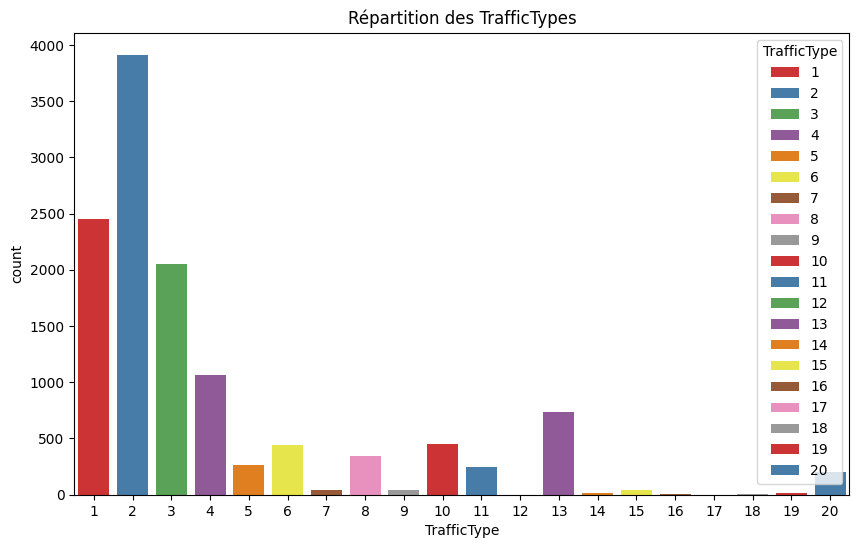

In [142]:
plt.figure(figsize=(10, 6))
sns.countplot(x='TrafficType', hue='TrafficType', data=df, palette='Set1')
plt.title('Répartition des TrafficTypes')
plt.show()

**Les trafics 1, 2 et 3 sont les plus utilisés**

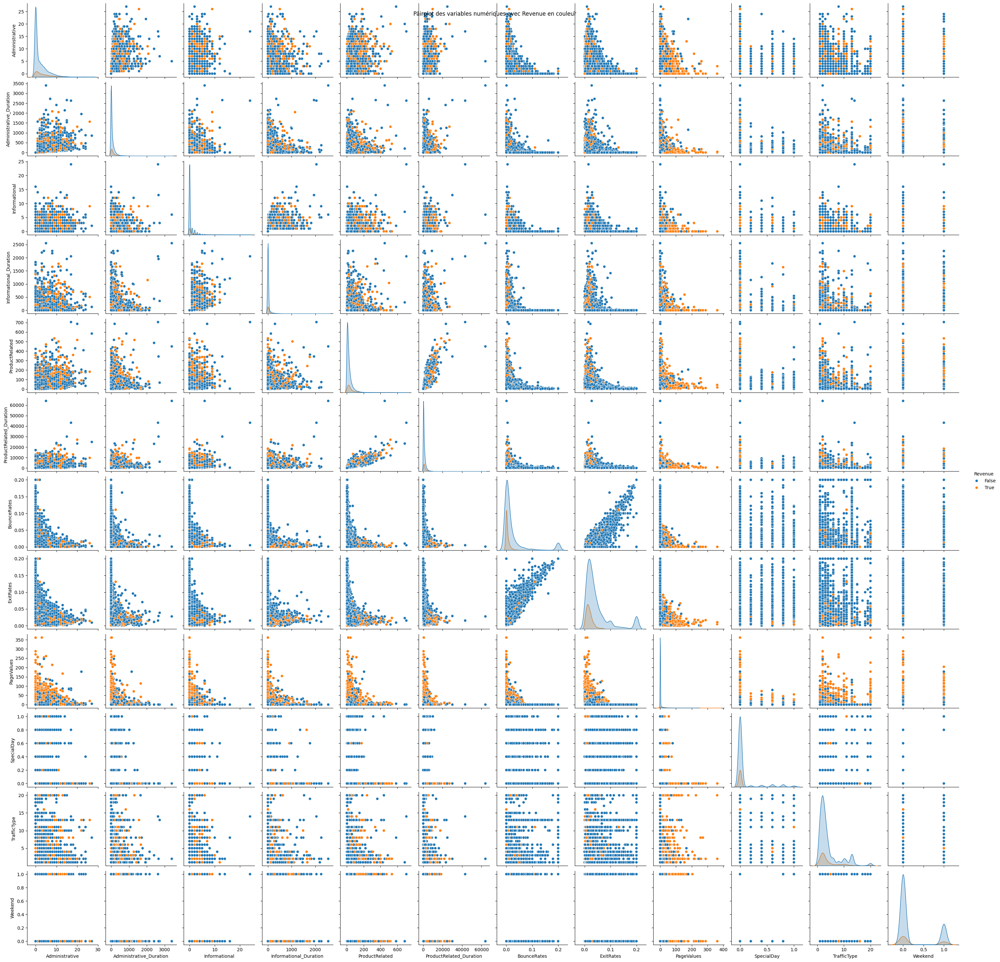

In [143]:
sns.pairplot(df, hue='Revenue', diag_kind='kde')
plt.suptitle('Pairplot des variables numériques avec Revenue en couleur')
plt.show()

### Traçons quelques boîtes à moustache pour voir quelques données statistiques et la répartition des valeurs des données

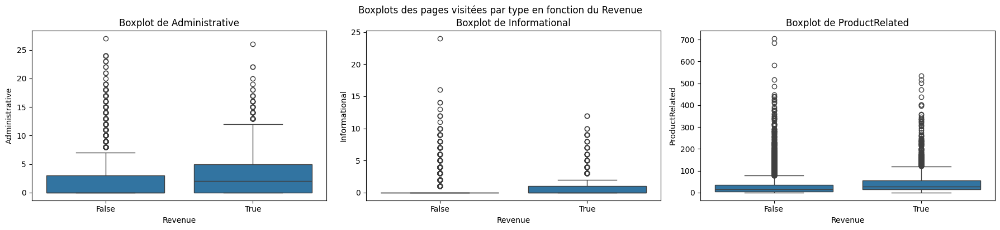

In [144]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 4))

for i, col in enumerate(['Administrative', 'Informational', 'ProductRelated']):
    sns.boxplot(x='Revenue', y=col, data=df, ax=axes[i])
    axes[i].set_title(f'Boxplot de {col}')

plt.tight_layout()
plt.suptitle('Boxplots des pages visitées par type en fonction du Revenue', y=1.02)
plt.show()

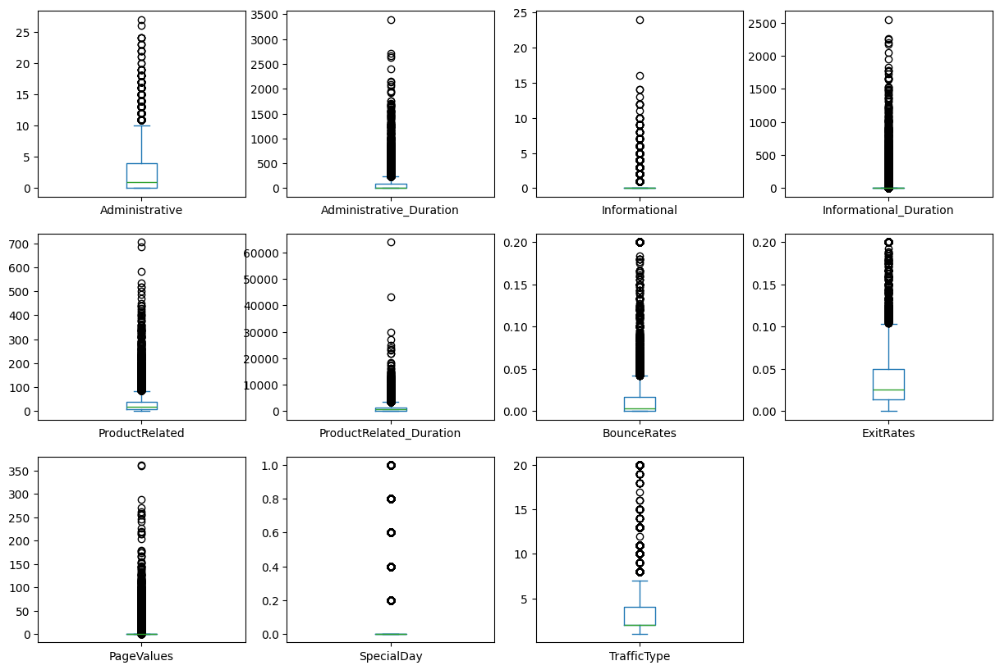

In [145]:
df.plot(kind='box', subplots=True, layout=(3,4), sharex=False, sharey=False, figsize=(15, 10))
plt.show()

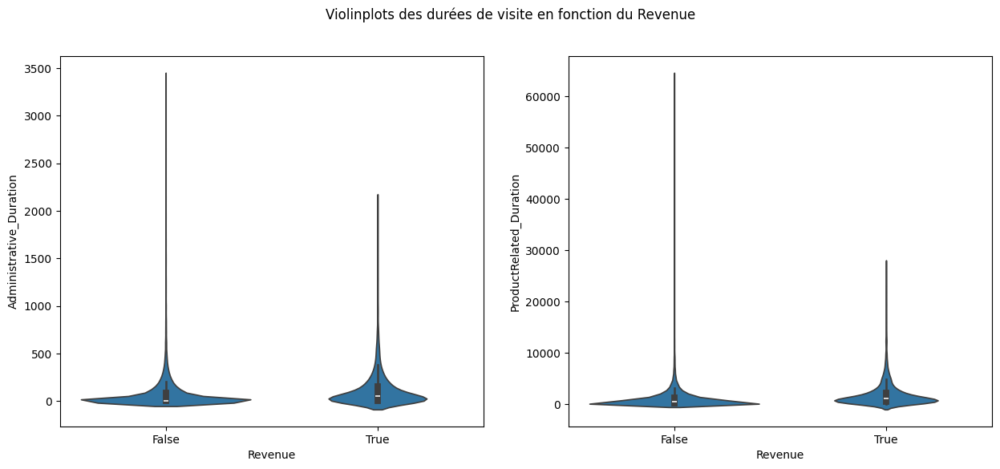

In [146]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))
for i, col in enumerate(['Administrative_Duration', 'ProductRelated_Duration']):
    sns.violinplot(x='Revenue', y=col, data=df, ax=axes[i])
plt.suptitle('Violinplots des durées de visite en fonction du Revenue')
plt.show()

### Traçons la répartition des types de visiteurs en fonction du week-end

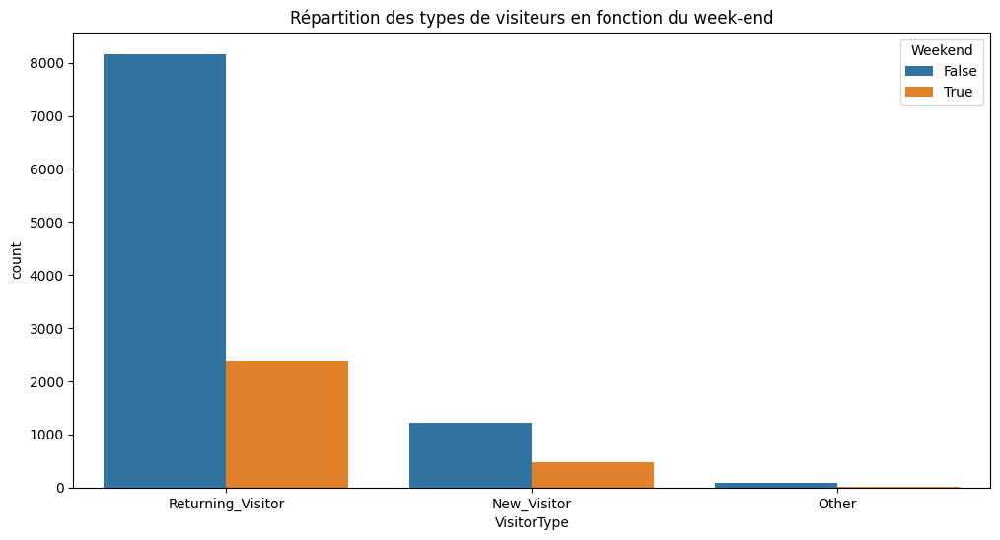

In [147]:
plt.figure(figsize=(12, 6))
sns.countplot(x='VisitorType', hue='Weekend', data=df)
plt.title('Répartition des types de visiteurs en fonction du week-end')
plt.show()

**On constate que les visites sont plus nombreuses Samedi que Dimanche**

### Analysons maintenant la distriubtion des visites et revenue en fonction du mois

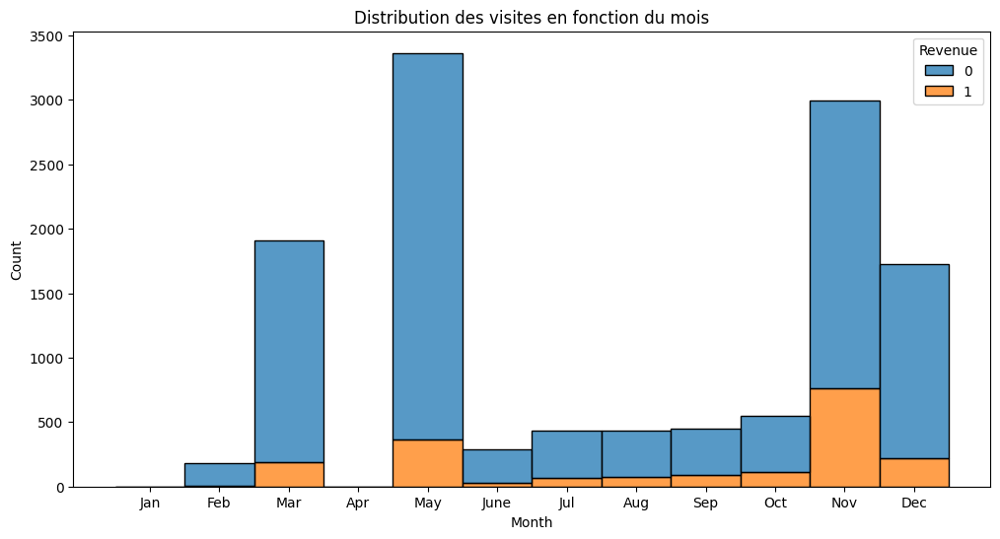

In [148]:
df3 = df.copy()
df3 = pd.concat([df3, pd.DataFrame({'Month': ['Jan', 'Apr'], 'Revenue': [0, 0]})], ignore_index=True)
df3['Month'] = pd.Categorical(df3['Month'], categories=ordre, ordered=True)

plt.figure(figsize=(12, 6))
sns.histplot(x='Month', hue='Revenue', multiple='stack', data=df3)
plt.title('Distribution des visites en fonction du mois')
plt.show()

**Sans surprise, les mois les plus visités sont ceux où il y a eu le plus de revenu**

### Traçons les histogrammes des revenus en fonction de chaque colonne du dataframe

In [149]:
df_revenue_true = df[df['Revenue'] == True]
df_revenue_false = df[df['Revenue'] == False]

In [150]:
df.columns[:-1]

Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay', 'Month',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'VisitorType',
       'Weekend'],
      dtype='object')

In [151]:
df_revenue_true[col].unique()

array([  798.3333333,  2111.341667 ,   607.       , ...,  4627.489571 ,
       11431.00124  ,  2773.5      ])

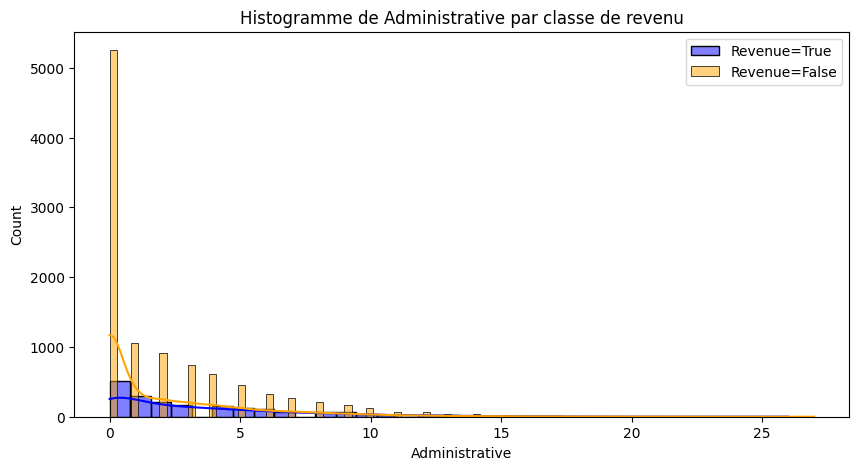

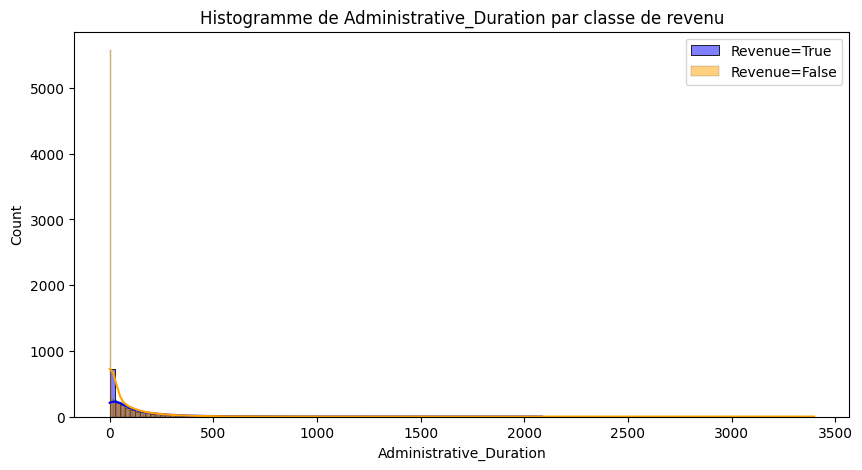

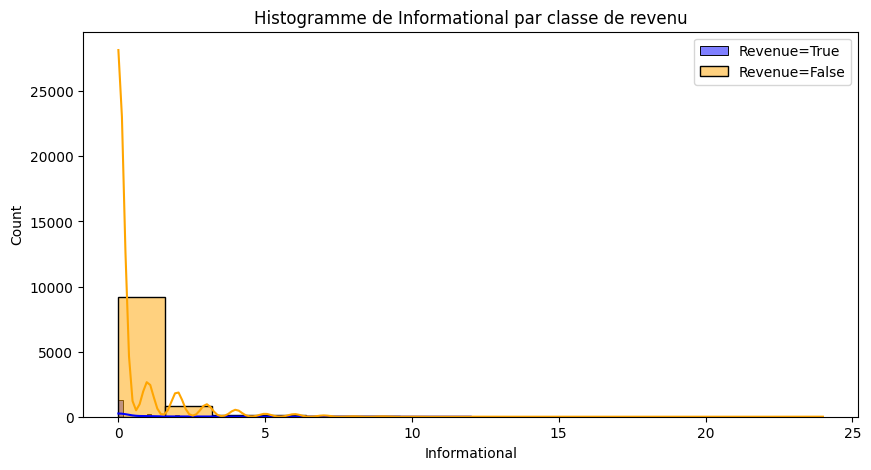

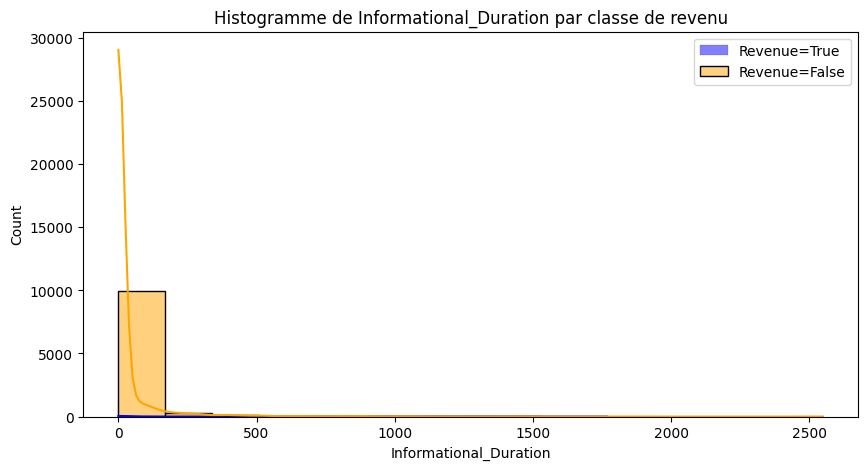

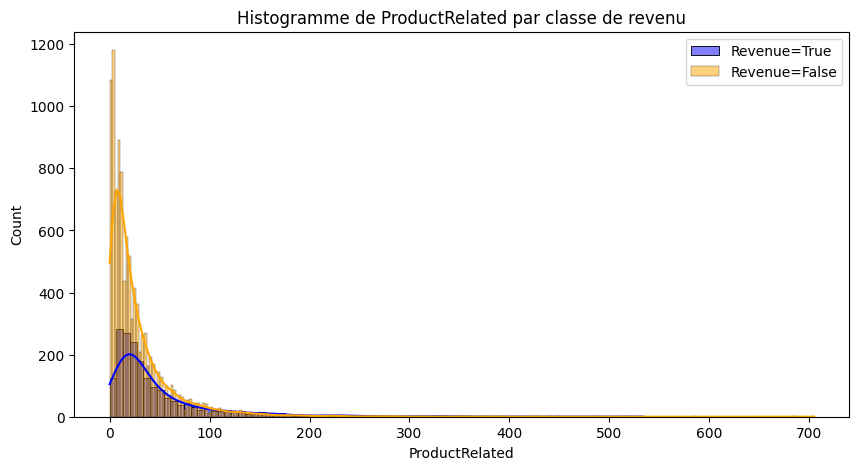

...

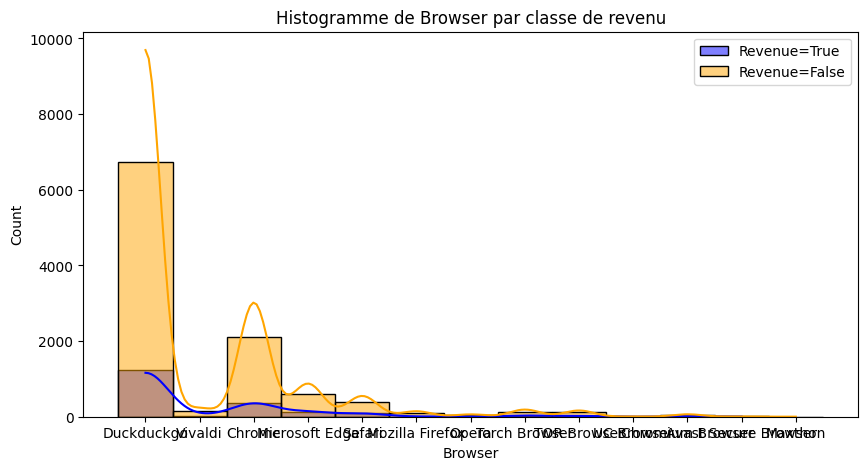

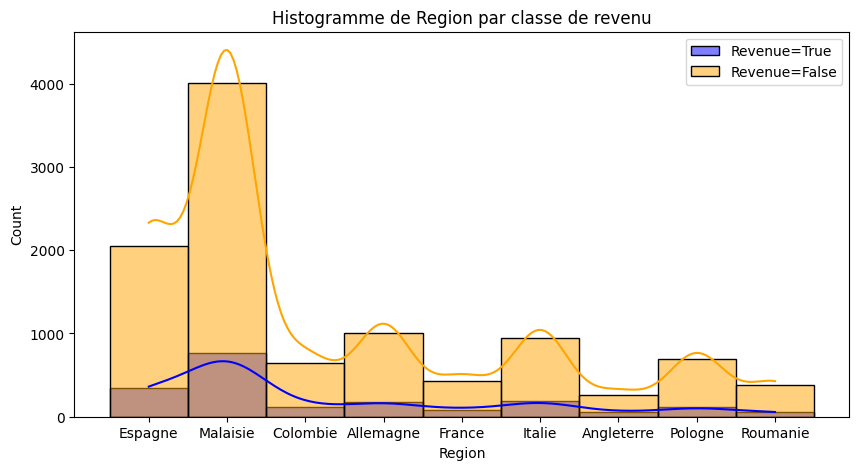

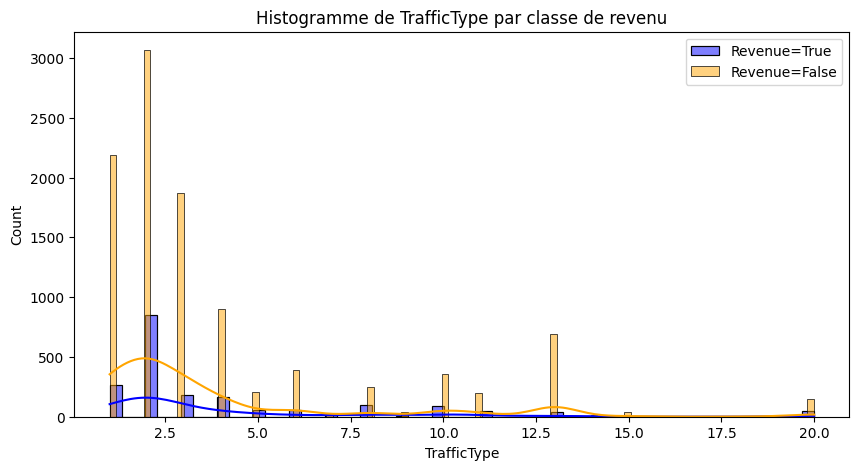

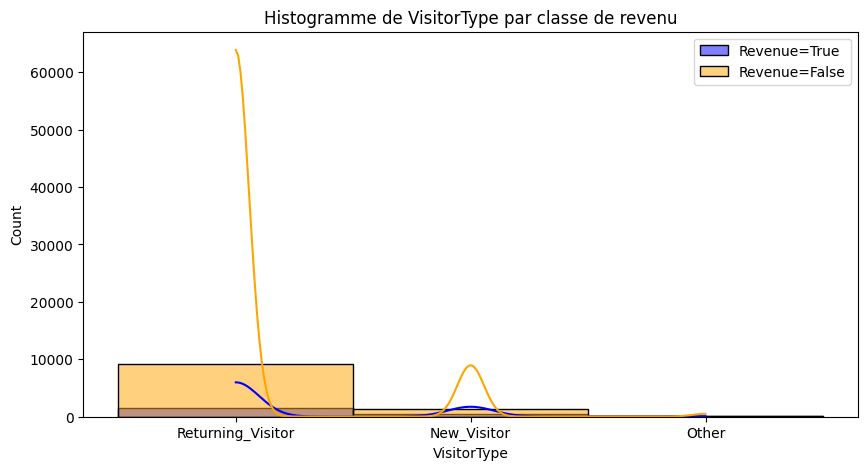

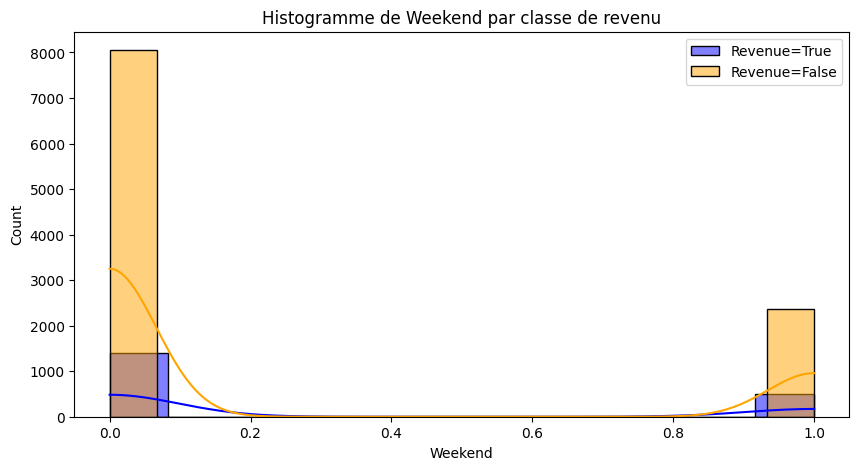

In [152]:
for col in df.columns[:-1]:
    plt.figure(figsize=(10, 5))
    sns.histplot(df_revenue_true[col], color='blue', label='Revenue=True', kde=True)
    sns.histplot(df_revenue_false[col], color='orange', label='Revenue=False', kde=True)
    plt.title(f'Histogramme de {col} par classe de revenu')
    plt.legend()
    plt.show()

### Prenons le log pour mettre les données dans une bonne échelle pour faire de meilleures comparaisons

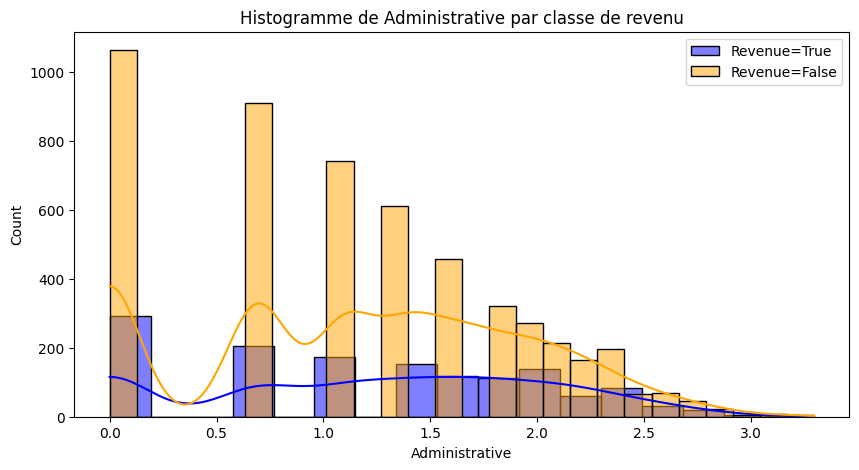

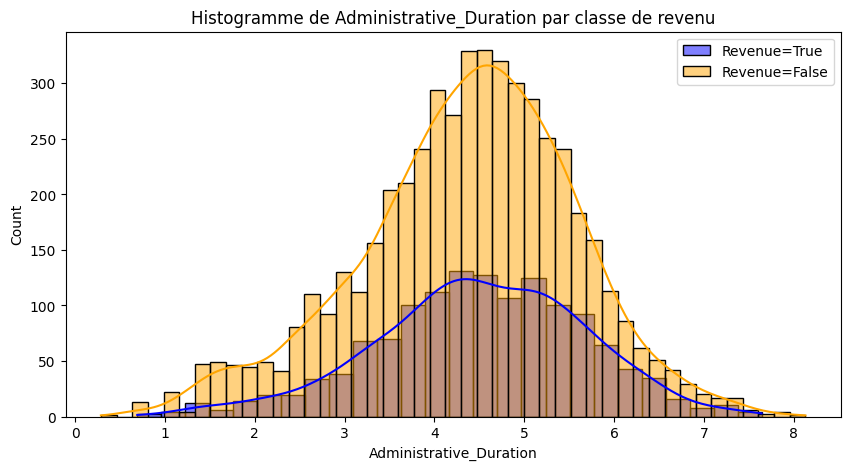

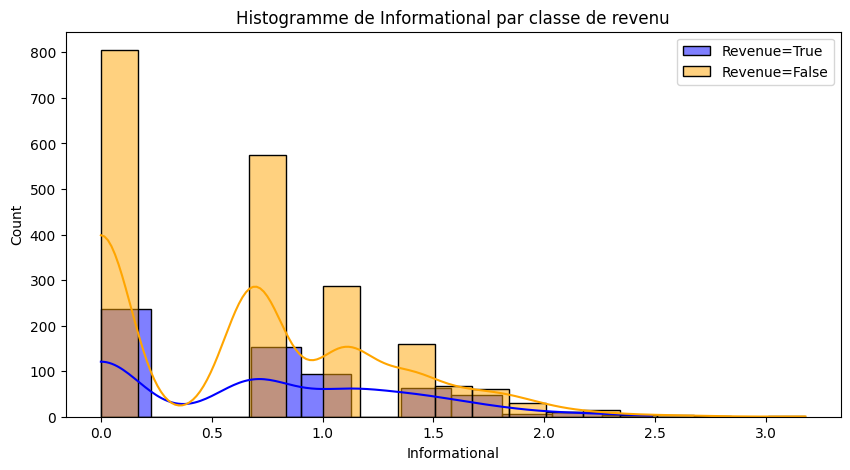

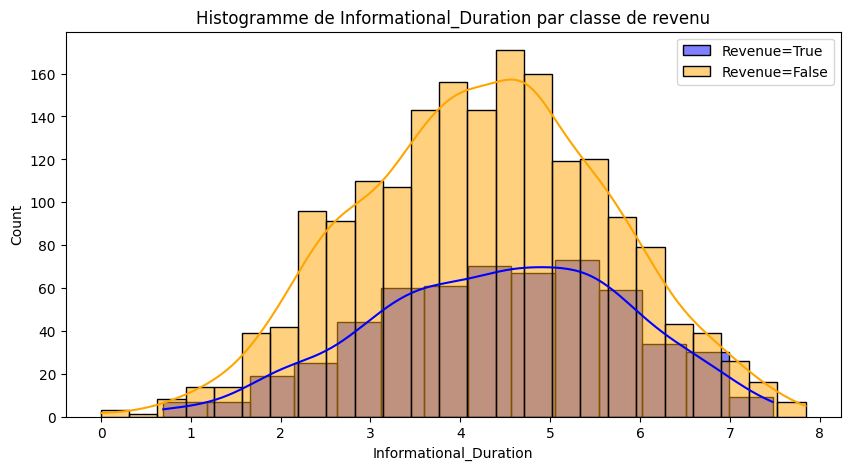

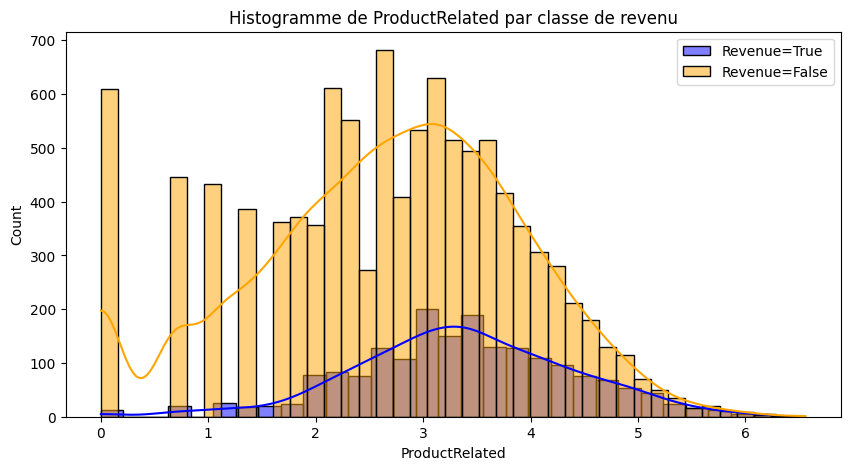

...

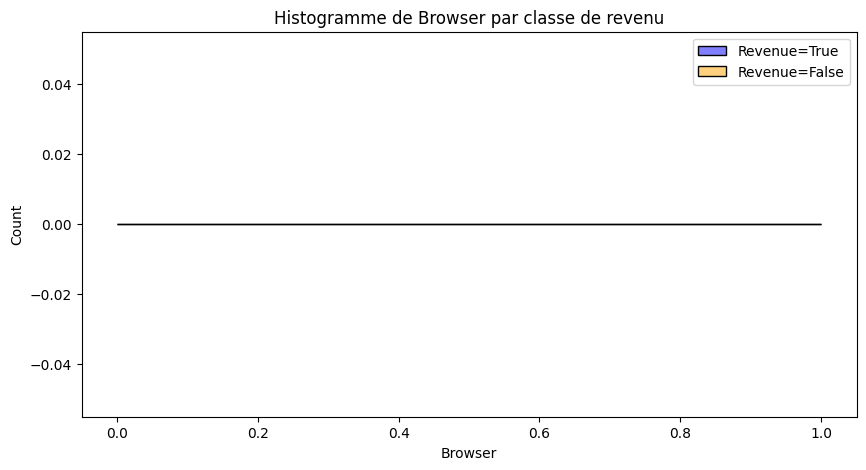

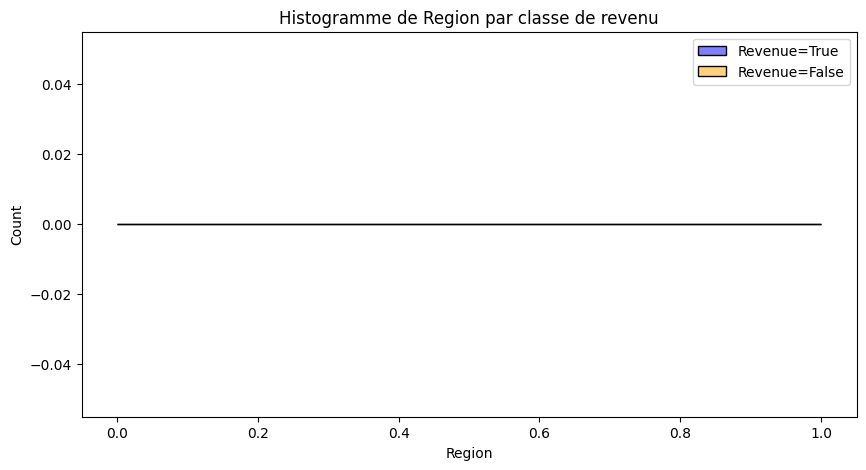

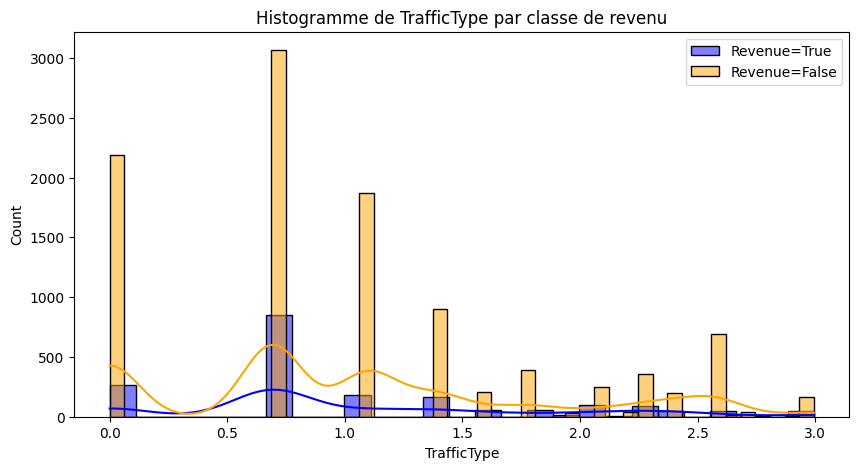

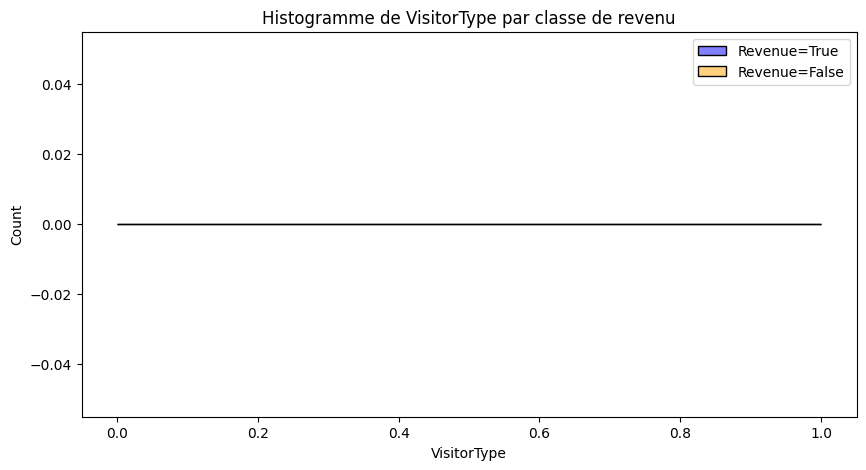

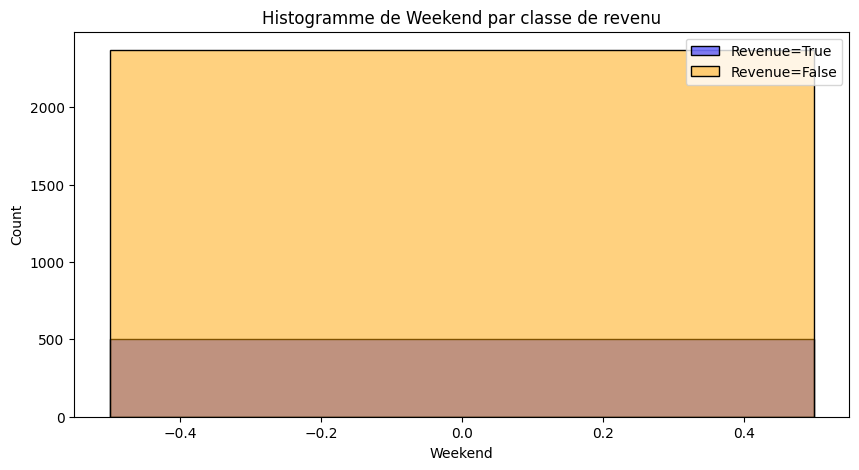

In [155]:
for col in df.columns[:-1]:
    plt.figure(figsize=(10, 5))
    
    # Convert column values to numeric
    df_revenue_true[col] = pd.to_numeric(df_revenue_true[col], errors='coerce')
    df_revenue_false[col] = pd.to_numeric(df_revenue_false[col], errors='coerce')

    sns.histplot(np.log(df_revenue_true[col]), color='blue', label='Revenue=True', kde=True)
    sns.histplot(np.log(df_revenue_false[col]), color='orange', label='Revenue=False', kde=True)
    
    plt.title(f'Histogramme de {col} par classe de revenu')
    plt.legend()
    plt.show()

**On peut penser par rapport à l'histogramme que les pages de types admnistratives ont plus de "chance" de rapporter des revenus lorsqu'elles sont moins longtemps consultées. En effet, le bâton le plus haut se trouve tout à droite à 0. Cela paraît contre intuitif mais en observant de plus prêt on remarque que la proportion de revenue = False pour la valeur 0 est 3 voir 4 fois plus élevée que celle de revenue = True. Finalement il ne faut pas se fier à la taille des revenues car il est cohérent que le revenu rapporté est plus fréquent puisque le nombre de fois où une page de type administrative a été consulté très brivement est beaucoup plus élevé que lorsqu'il est consulté plus longtemps. En revanche, si on compare la proportion sur une même durée entre revenue = True et revenue = False, on constate que généralement, un visiteur aura plus le visiteur reste longtemps sur le site, plus la "chance" de contribuer positivement au revenu est grande.**

**Pour l'histogramme pour le type de page Administrative_Duration, on remarqu'en générale la probabilité pour qu'un visiteur contribue positivement au revenu est de 50% voir un peu au dessus lorsque les visiteurs ont tendance à rester plus longtemps.**

**Pour l'histogramme pour le type de page informationnel, on a les mêmes conclusions que pour les types de pages administratives.**

**Pour l'histogramme pour le type de page Informational_Duration, on a les mêmes conclusions que pour le type de page Administrative.**

**Pour l'histogramme du type de page ProductRelated, on constate que plus le visiteur va passer du temps sur la page, plus la probabilité de contribuer au revenu va être grande voir atteindre 100% (entre 5 et 6) de même pour l'histogramme de ProductRelated.**

**On remarque sur l'histogramme des mois que le mois de Novembre est le mois qui rapporte le plus de revenu est que la proportion de visteurs qui rapportent du revenu sur le nombre de visiteurs total du mois et proche de 50 % contrairement au mois de Mars, Mai et Décembre qui sont les seconds mois a rapporter des revenus où se rapport est plus petit.**

**Sur l'histogramme des régions, on constate que les visiteurs de la Malaisie contribuent le plus au revenu car ils sont plus nombreux (juste en terme de visiteurs). On remarque aussi qu'environ 1/4 des visiteurs contribuent au revenu et cela indépendament du pays d'où il vient.**

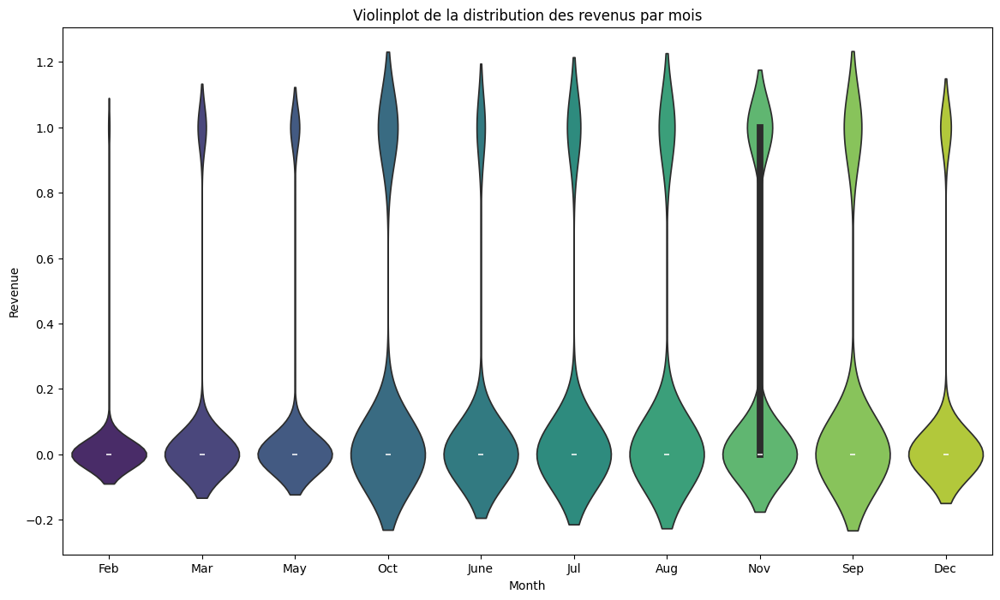

In [156]:
plt.figure(figsize=(14, 8))
sns.violinplot(x='Month', y='Revenue', hue='Month', data=df, palette='viridis')
plt.title('Violinplot de la distribution des revenus par mois')
plt.show()

### Représentons la répartition des types de visiteurs par classe de revenu

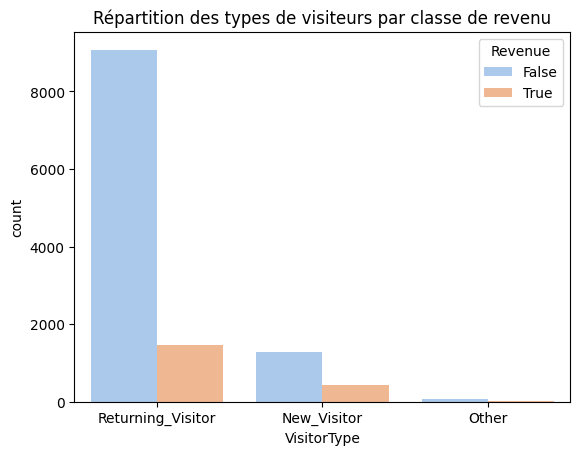

In [157]:
##### plt.figure(figsize=(10, 6))
sns.countplot(x='VisitorType', hue='Revenue', data=df, palette='pastel')
plt.title('Répartition des types de visiteurs par classe de revenu')
plt.show()

**On remarque que les anciens visiteurs sont ceux qui rapportent le plus de revenu (deux fois plus que les nouveaux visiteurs) mais que l'écart entre ceux qui rapportent du revenus et ceux qui n'en rapportent pas parmis les anciens visiteurs est beaucoup plus grande (facteur 2 voir 3) que celui des nouveaux visiteurs**

### Observons la répartition des systèmes d'exploitation par classe de revenu

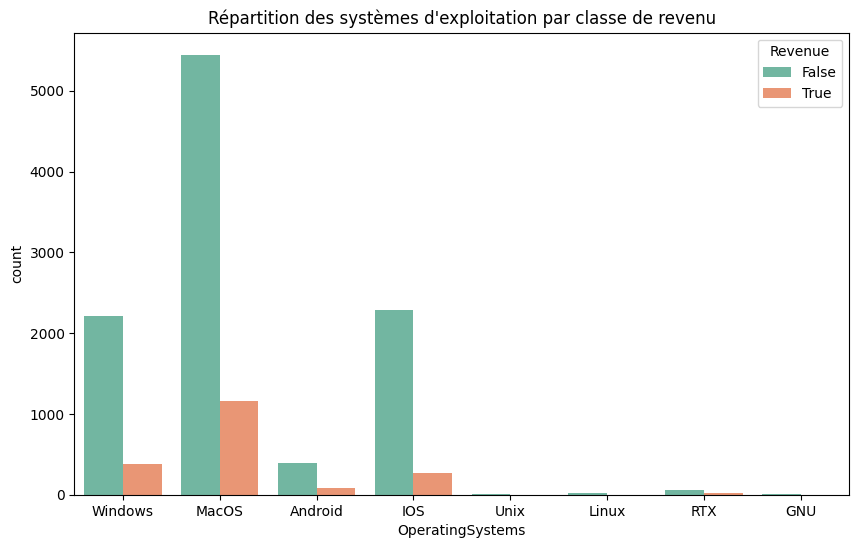

In [158]:
plt.figure(figsize=(10, 6))
sns.countplot(x='OperatingSystems', hue='Revenue', data=df, palette='Set2')
plt.title('Répartition des systèmes d\'exploitation par classe de revenu')
plt.show()

**Windows, MacOs et IOS semblent faire partie des paramètres qui augmentent les revenus. Mais étant donné que ce sont les systèmes utilisés par les visiteurs, il parait intuitif que la diagramme prenne cette tournure, on ne peut donc pas conclure que le fait d'utiliser ces operating systemes serait un facteur qui rapporterait potentiellement des revenus. En revanche, on peut voir que l'écart entre ceux qui rapportent des revenus et ceux qui n'en rapportent pas semblent être similaire pour chaque operating systems (rapport de 4)**

<h1>Classification</h1>

<h5>On n'utilisera pas toujours le gridsearch car sinon on mettrait beaucoup plus de temps à faire tourner les modèles et le notebook prend déjà facilement 1h30 à s'exécuter en entier...</h5>

In [159]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.pipeline import Pipeline

In [161]:
data_for_classification = df2.copy().drop(columns='Revenue')
target = df2['Revenue']

In [162]:
scaler = StandardScaler()
pca = PCA(n_components=2)

In [163]:
data_for_classification_scaled = scaler.fit_transform(data_for_classification)
data_for_classification_pca = pca.fit_transform(data_for_classification_scaled)
X_train, X_test, y_train, y_test = train_test_split(data_for_classification_pca, target, test_size=0.2, random_state=42)
X_train2, X_test2, y_train2, y_test2 = train_test_split(data_for_classification_scaled, target, test_size=0.2, random_state=42)

<h3>RandomForestClassifier</h3>

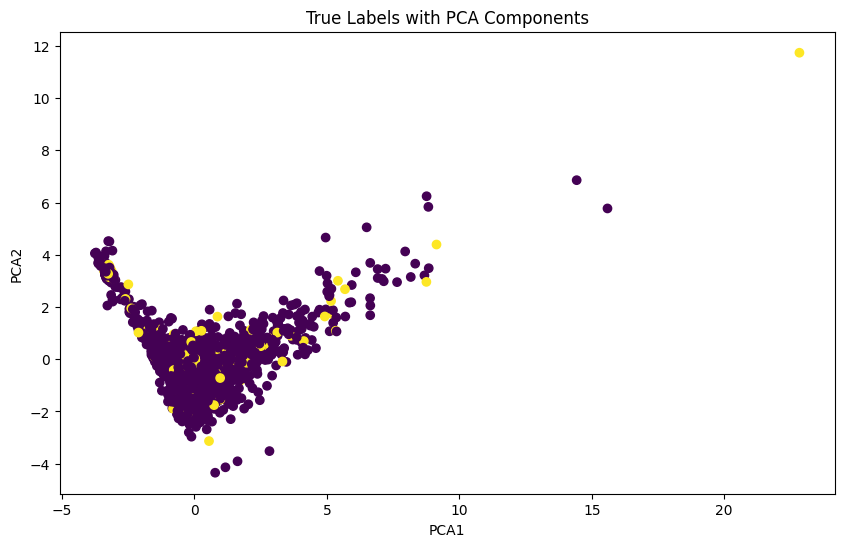

Best Hyperparameters: {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100}
Accuracy (Random Forest): 0.8422546634225466
Confusion Matrix (Random Forest):
[[2033   22]
 [ 367   44]]
Error Rate (Random Forest): 0.15774533657745338
Classification Report (Random Forest):
              precision    recall  f1-score   support

           0       0.85      0.99      0.91      2055
           1       0.67      0.11      0.18       411

    accuracy                           0.84      2466
   macro avg       0.76      0.55      0.55      2466
weighted avg       0.82      0.84      0.79      2466



In [164]:
from sklearn.ensemble import RandomForestClassifier

param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

rf_classifier = RandomForestClassifier(random_state=42)

grid_search = GridSearchCV(rf_classifier, param_grid, cv=5)
grid_search.fit(X_train, y_train)

best_rf_model = grid_search.best_estimator_

y_pred = best_rf_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

pca_df = pd.DataFrame(X_test, columns=['PCA1', 'PCA2'])
pca_df['True_Labels'] = y_train

plt.figure(figsize=(10, 6))
scatter = plt.scatter(pca_df['PCA1'], pca_df['PCA2'], c=pca_df['True_Labels'], cmap='viridis')
plt.title('True Labels with PCA Components')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
#plt.legend(*scatter.legend_elements(), title='Labels') # à changer, ça fait bugger
plt.show()


print(f'Best Hyperparameters: {grid_search.best_params_}')

accuracy_rf = accuracy_score(y_test, y_pred)
print(f'Accuracy (Random Forest): {accuracy_rf}')

conf_matrix_rf = confusion_matrix(y_test, y_pred)
print(f'Confusion Matrix (Random Forest):\n{conf_matrix_rf}')

error_rate_rf = 1 - accuracy_rf
print(f'Error Rate (Random Forest): {error_rate_rf}')

class_report_rf = classification_report(y_test, y_pred)
print(f'Classification Report (Random Forest):\n{class_report_rf}')

<h3>RandomForestClassifier sans PCA</h3>

In [165]:
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

rf_classifier = RandomForestClassifier(random_state=42)

grid_search = GridSearchCV(rf_classifier, param_grid, cv=5)
grid_search.fit(X_train2, y_train2)

best_rf_model = grid_search.best_estimator_

y_pred = best_rf_model.predict(X_test2)


print(f'Best Hyperparameters: {grid_search.best_params_}')

accuracy_rf = accuracy_score(y_test2, y_pred)
print(f'Accuracy (Random Forest): {accuracy_rf}')

conf_matrix_rf = confusion_matrix(y_test2, y_pred)
print(f'Confusion Matrix (Random Forest):\n{conf_matrix_rf}')

error_rate_rf = 1 - accuracy_rf
print(f'Error Rate (Random Forest): {error_rate_rf}')

class_report_rf = classification_report(y_test2, y_pred)
print(f'Classification Report (Random Forest):\n{class_report_rf}')

Best Hyperparameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 150}
Accuracy (Random Forest): 0.8913219789132197
Confusion Matrix (Random Forest):
[[1986   69]
 [ 199  212]]
Error Rate (Random Forest): 0.10867802108678026
Classification Report (Random Forest):
              precision    recall  f1-score   support

           0       0.91      0.97      0.94      2055
           1       0.75      0.52      0.61       411

    accuracy                           0.89      2466
   macro avg       0.83      0.74      0.77      2466
weighted avg       0.88      0.89      0.88      2466



<h3>KNeighborsClassifier</h3>

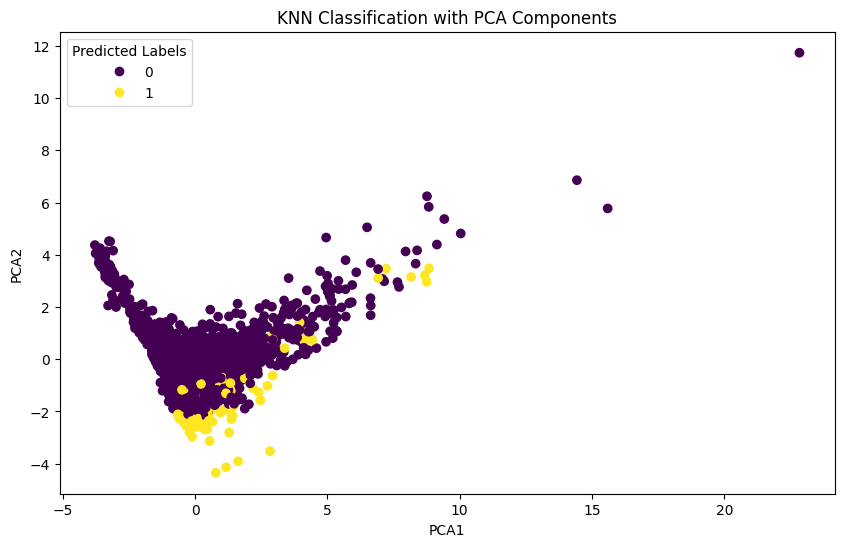

Best Hyperparameters: {'n_neighbors': 9}
Accuracy (KNN): 0.8398215733982157
Confusion Matrix (KNN):
[[1996   59]
 [ 336   75]]
Error Rate (KNN): 0.16017842660178427
Classification Report (KNN):
              precision    recall  f1-score   support

           0       0.86      0.97      0.91      2055
           1       0.56      0.18      0.28       411

    accuracy                           0.84      2466
   macro avg       0.71      0.58      0.59      2466
weighted avg       0.81      0.84      0.80      2466



In [166]:
from sklearn.neighbors import KNeighborsClassifier

n_neighbors_values = [3, 5, 7, 9]

param_grid = {'n_neighbors': n_neighbors_values}

knn = KNeighborsClassifier()

grid_search = GridSearchCV(knn, param_grid, cv=5)
grid_search.fit(X_train, y_train)

best_knn_model = grid_search.best_estimator_

best_knn_labels = best_knn_model.predict(X_test)

pca_df = pd.DataFrame(X_test, columns=['PCA1', 'PCA2'])
pca_df['Predicted_Labels'] = best_knn_labels

plt.figure(figsize=(10, 6))
scatter = plt.scatter(pca_df['PCA1'], pca_df['PCA2'], c=pca_df['Predicted_Labels'], cmap='viridis')
plt.title('KNN Classification with PCA Components')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.legend(*scatter.legend_elements(), title='Predicted Labels')
plt.show()


print(f'Best Hyperparameters: {grid_search.best_params_}')

accuracy_knn = accuracy_score(y_test, best_knn_labels)
print(f'Accuracy (KNN): {accuracy_knn}')

conf_matrix_knn = confusion_matrix(y_test, best_knn_labels)
print(f'Confusion Matrix (KNN):\n{conf_matrix_knn}')

error_rate_knn = 1 - accuracy_knn
print(f'Error Rate (KNN): {error_rate_knn}')

class_report_knn = classification_report(y_test, best_knn_labels)
print(f'Classification Report (KNN):\n{class_report_knn}')

<h3>KNeighborsClassifier sans PCA</h3>

In [167]:
n_neighbors_values = [i for i in range (1,11)]

param_grid = {'n_neighbors': n_neighbors_values}

knn = KNeighborsClassifier()

grid_search = GridSearchCV(knn, param_grid, cv=5)
grid_search.fit(X_train2, y_train2)

best_knn_model = grid_search.best_estimator_

best_knn_labels = best_knn_model.predict(X_test2)


print(f'Best Hyperparameters: {grid_search.best_params_}')

accuracy_knn = accuracy_score(y_test2, best_knn_labels)
print(f'Accuracy (KNN): {accuracy_knn}')

conf_matrix_knn = confusion_matrix(y_test2, best_knn_labels)
print(f'Confusion Matrix (KNN):\n{conf_matrix_knn}')

error_rate_knn = 1 - accuracy_knn
print(f'Error Rate (KNN): {error_rate_knn}')

class_report_knn = classification_report(y_test2, best_knn_labels)
print(f'Classification Report (KNN):\n{class_report_knn}')

Best Hyperparameters: {'n_neighbors': 9}
Accuracy (KNN): 0.8682076236820763
Confusion Matrix (KNN):
[[2008   47]
 [ 278  133]]
Error Rate (KNN): 0.13179237631792373
Classification Report (KNN):
              precision    recall  f1-score   support

           0       0.88      0.98      0.93      2055
           1       0.74      0.32      0.45       411

    accuracy                           0.87      2466
   macro avg       0.81      0.65      0.69      2466
weighted avg       0.86      0.87      0.85      2466



<h3>GaussianNB</h3>

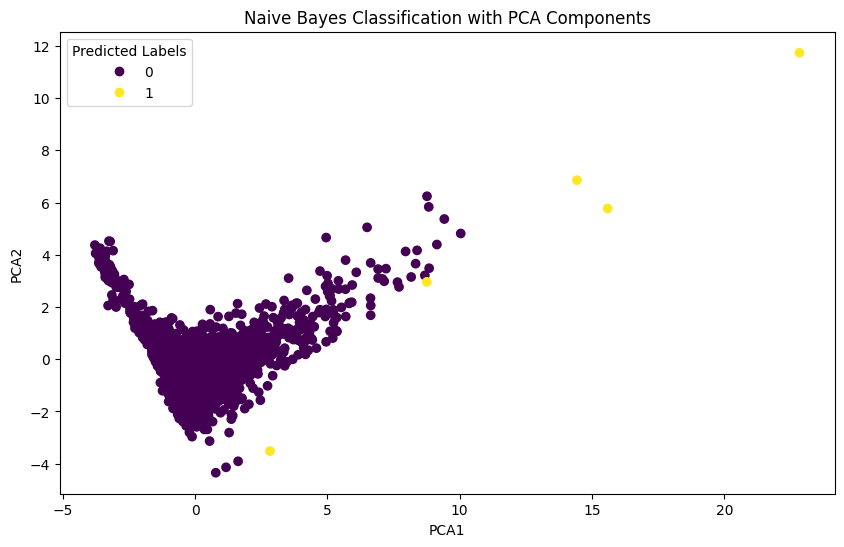

Accuracy (Naive Bayes): 0.8337388483373885
Confusion Matrix (Naive Bayes):
[[2053    2]
 [ 408    3]]
Error Rate (Naive Bayes): 0.16626115166261146
Classification Report (Naive Bayes):
              precision    recall  f1-score   support

           0       0.83      1.00      0.91      2055
           1       0.60      0.01      0.01       411

    accuracy                           0.83      2466
   macro avg       0.72      0.50      0.46      2466
weighted avg       0.80      0.83      0.76      2466



In [168]:
from sklearn.naive_bayes import GaussianNB

naive_bayes = GaussianNB()

naive_bayes.fit(X_train, y_train)

predicted_labels = naive_bayes.predict(X_test)

pca_df = pd.DataFrame(X_test, columns=['PCA1', 'PCA2'])
pca_df['Predicted_Labels'] = predicted_labels

plt.figure(figsize=(10, 6))
scatter = plt.scatter(pca_df['PCA1'], pca_df['PCA2'], c=pca_df['Predicted_Labels'], cmap='viridis')
plt.title('Naive Bayes Classification with PCA Components')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.legend(*scatter.legend_elements(), title='Predicted Labels')
plt.show()


accuracy_nb = accuracy_score(y_test, predicted_labels)
print(f'Accuracy (Naive Bayes): {accuracy_nb}')

conf_matrix_nb = confusion_matrix(y_test, predicted_labels)
print(f'Confusion Matrix (Naive Bayes):\n{conf_matrix_nb}')
error_rate_nb = 1 - accuracy_nb
print(f'Error Rate (Naive Bayes): {error_rate_nb}')

class_report_nb = classification_report(y_test, predicted_labels)
print(f'Classification Report (Naive Bayes):\n{class_report_nb}')

<h3>GaussianNB sans PCA</h3>

In [169]:
from sklearn.naive_bayes import GaussianNB

naive_bayes = GaussianNB()

naive_bayes.fit(X_train2, y_train2)

predicted_labels = naive_bayes.predict(X_test2)


accuracy_nb = accuracy_score(y_test2, predicted_labels)
print(f'Accuracy (Naive Bayes): {accuracy_nb}')

conf_matrix_nb = confusion_matrix(y_test2, predicted_labels)
print(f'Confusion Matrix (Naive Bayes):\n{conf_matrix_nb}')

error_rate_nb = 1 - accuracy_nb
print(f'Error Rate (Naive Bayes): {error_rate_nb}')

class_report_nb = classification_report(y_test2, predicted_labels)
print(f'Classification Report (Naive Bayes):\n{class_report_nb}')

Accuracy (Naive Bayes): 0.7850770478507705
Confusion Matrix (Naive Bayes):
[[1654  401]
 [ 129  282]]
Error Rate (Naive Bayes): 0.21492295214922952
Classification Report (Naive Bayes):
              precision    recall  f1-score   support

           0       0.93      0.80      0.86      2055
           1       0.41      0.69      0.52       411

    accuracy                           0.79      2466
   macro avg       0.67      0.75      0.69      2466
weighted avg       0.84      0.79      0.80      2466



<h3>SVC</h3>

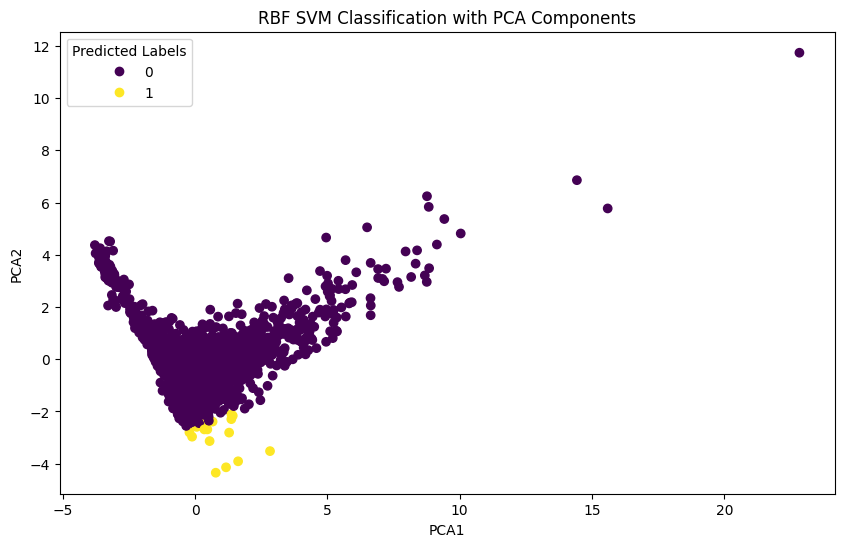

Accuracy (SVM): 0.8381995133819952
Confusion Matrix (SVM):
[[2053    2]
 [ 397   14]]
Error Rate (SVM): 0.16180048661800484
Classification Report (SVM):
              precision    recall  f1-score   support

           0       0.84      1.00      0.91      2055
           1       0.88      0.03      0.07       411

    accuracy                           0.84      2466
   macro avg       0.86      0.52      0.49      2466
weighted avg       0.84      0.84      0.77      2466



In [170]:
from sklearn.svm import SVC

svm_model = SVC(kernel='rbf')

svm_model.fit(X_train, y_train)

predicted_labels = svm_model.predict(X_test)

pca_df = pd.DataFrame(X_test, columns=['PCA1', 'PCA2'])
pca_df['Predicted_Labels'] = predicted_labels

plt.figure(figsize=(10, 6))
scatter = plt.scatter(pca_df['PCA1'], pca_df['PCA2'], c=pca_df['Predicted_Labels'], cmap='viridis')
plt.title('RBF SVM Classification with PCA Components')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.legend(*scatter.legend_elements(), title='Predicted Labels')
plt.show()


accuracy_svm = accuracy_score(y_test, predicted_labels)
print(f'Accuracy (SVM): {accuracy_svm}')

conf_matrix_svm = confusion_matrix(y_test, predicted_labels)
print(f'Confusion Matrix (SVM):\n{conf_matrix_svm}')

error_rate_svm = 1 - accuracy_svm
print(f'Error Rate (SVM): {error_rate_svm}')

class_report_svm = classification_report(y_test, predicted_labels)
print(f'Classification Report (SVM):\n{class_report_svm}')

<h3>SVC sans PCA</h3>

In [171]:
from sklearn.svm import SVC

svm_model = SVC(kernel='rbf')

svm_model.fit(X_train2, y_train2)

predicted_labels = svm_model.predict(X_test2)


accuracy_svm = accuracy_score(y_test2, predicted_labels)
print(f'Accuracy (SVM): {accuracy_svm}')

conf_matrix_svm = confusion_matrix(y_test2, predicted_labels)
print(f'Confusion Matrix (SVM):\n{conf_matrix_svm}')

error_rate_svm = 1 - accuracy_svm
print(f'Error Rate (SVM): {error_rate_svm}')

class_report_svm = classification_report(y_test2, predicted_labels)
print(f'Classification Report (SVM):\n{class_report_svm}')

Accuracy (SVM): 0.878345498783455
Confusion Matrix (SVM):
[[1993   62]
 [ 238  173]]
Error Rate (SVM): 0.12165450121654497
Classification Report (SVM):
              precision    recall  f1-score   support

           0       0.89      0.97      0.93      2055
           1       0.74      0.42      0.54       411

    accuracy                           0.88      2466
   macro avg       0.81      0.70      0.73      2466
weighted avg       0.87      0.88      0.86      2466



<h3>XGBClassifier</h3>

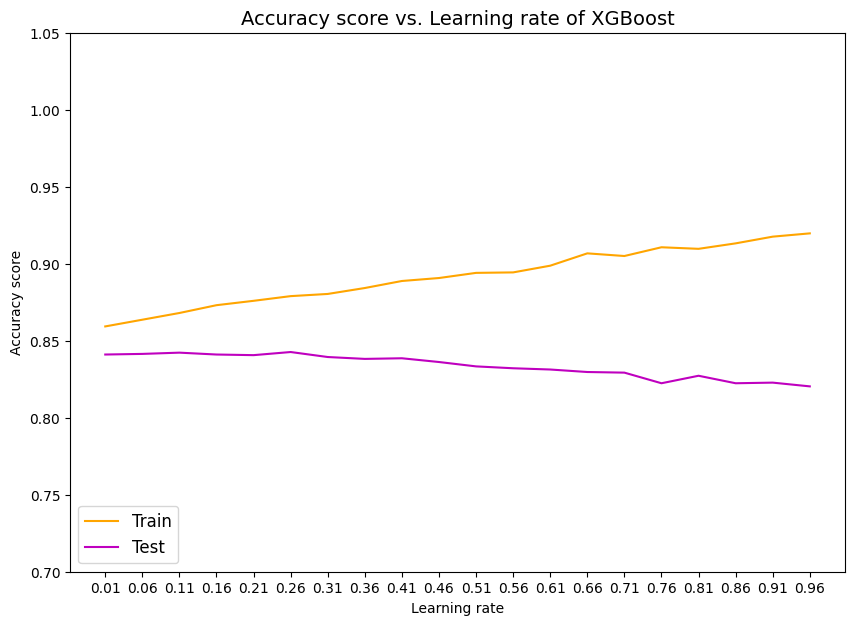

Accuracy: 0.8426601784266018
Confusion Matrix:
[[2015   40]
 [ 348   63]]
Error Rate: 0.1573398215733982
Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.98      0.91      2055
           1       0.61      0.15      0.25       411

    accuracy                           0.84      2466
   macro avg       0.73      0.57      0.58      2466
weighted avg       0.81      0.84      0.80      2466



In [172]:
import xgboost as xgb

# XGBoost (different learning rate)
learning_rate_range = np.arange(0.01, 1, 0.05)
test_XG = [] 
train_XG = []
for lr in learning_rate_range:
    xgb_classifier = xgb.XGBClassifier(eta = lr)
    xgb_classifier.fit(X_train, y_train)
    train_XG.append(xgb_classifier.score(X_train, y_train))
    test_XG.append(xgb_classifier.score(X_test, y_test))

fig = plt.figure(figsize=(10, 7))
plt.plot(learning_rate_range, train_XG, c='orange', label='Train')
plt.plot(learning_rate_range, test_XG, c='m', label='Test')
plt.xlabel('Learning rate')
plt.xticks(learning_rate_range)
plt.ylabel('Accuracy score')
plt.ylim(0.7, 1.05)
plt.legend(prop={'size': 12}, loc=3)
plt.title('Accuracy score vs. Learning rate of XGBoost', size=14)
plt.show()

best_learning_rate = learning_rate_range[np.argmax(test_XG)]

best_xgb_classifier = xgb.XGBClassifier(eta=best_learning_rate)
best_xgb_classifier.fit(X_train, y_train)

y_pred = best_xgb_classifier.predict(X_test)


accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')

conf_matrix = confusion_matrix(y_test, y_pred)
print(f'Confusion Matrix:\n{conf_matrix}')

error_rate = 1 - accuracy
print(f'Error Rate: {error_rate}')

class_report = classification_report(y_test, y_pred)
print(f'Classification Report:\n{class_report}')

<h3>XGBClassifier sans PCA</h3>

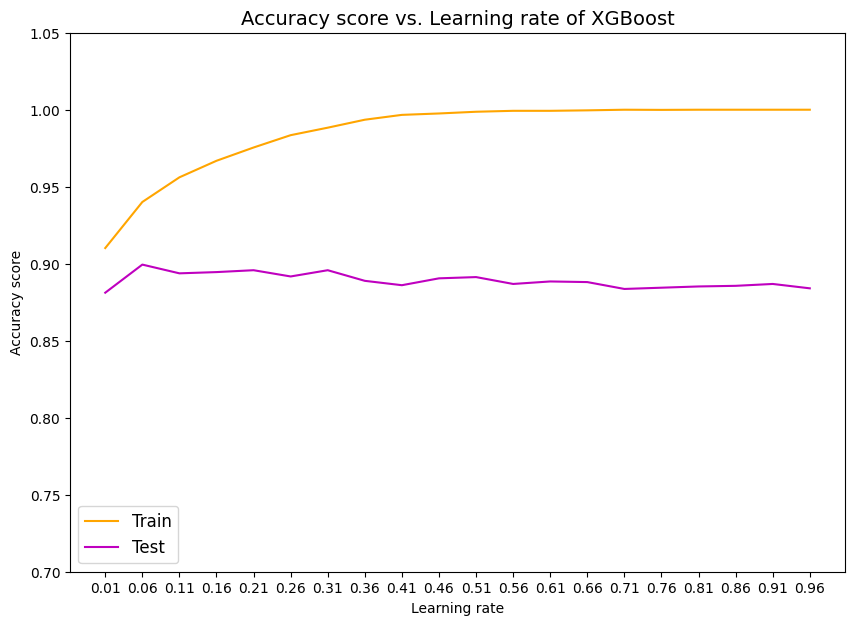

Accuracy: 0.8994322789943228
Confusion Matrix:
[[1972   83]
 [ 165  246]]
Error Rate: 0.10056772100567724
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.96      0.94      2055
           1       0.75      0.60      0.66       411

    accuracy                           0.90      2466
   macro avg       0.84      0.78      0.80      2466
weighted avg       0.89      0.90      0.89      2466



In [173]:
import xgboost as xgb

# XGBoost (différents taux d'apprentissage)
learning_rate_range = np.arange(0.01, 1, 0.05)
test_XG = [] 
train_XG = []
for lr in learning_rate_range:
    xgb_classifier = xgb.XGBClassifier(eta = lr)
    xgb_classifier.fit(X_train2, y_train2)
    train_XG.append(xgb_classifier.score(X_train2, y_train2))
    test_XG.append(xgb_classifier.score(X_test2, y_test2))

fig = plt.figure(figsize=(10, 7))
plt.plot(learning_rate_range, train_XG, c='orange', label='Train')
plt.plot(learning_rate_range, test_XG, c='m', label='Test')
plt.xlabel('Learning rate')
plt.xticks(learning_rate_range)
plt.ylabel('Accuracy score')
plt.ylim(0.7, 1.05)
plt.legend(prop={'size': 12}, loc=3)
plt.title('Accuracy score vs. Learning rate of XGBoost', size=14)
plt.show()

best_learning_rate = learning_rate_range[np.argmax(test_XG)]

best_xgb_classifier = xgb.XGBClassifier(eta=best_learning_rate)
best_xgb_classifier.fit(X_train2, y_train2)

y_pred = best_xgb_classifier.predict(X_test2)


accuracy = accuracy_score(y_test2, y_pred)
print(f'Accuracy: {accuracy}')

conf_matrix = confusion_matrix(y_test2, y_pred)
print(f'Confusion Matrix:\n{conf_matrix}')

error_rate = 1 - accuracy
print(f'Error Rate: {error_rate}')

class_report = classification_report(y_test2, y_pred)
print(f'Classification Report:\n{class_report}')

<h5>C'est pour l'instant le meilleur modèle (personne n'est surpris) avec une accuracy d'environ 0.90 et avec le moins de faux positif et de faux négatif réunie </h5>

### Regression Logistic sans PCA

<h5>Pour voir si réellement un modèle de régression ne serait pas adapté dans notre cas, et donc il ne faudrait utiliser que de la classification (Revenue booléen True/False ou binaire 0/1 et non une valeur continue)</h5>

In [174]:
from sklearn.linear_model import LogisticRegression

pipel_LR = Pipeline(steps = [('scale', StandardScaler()), ('model', LogisticRegression())])
pipel_LR.fit(X_train2, y_train2)
y_pred = pipel_LR.predict(X_test2)
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [175]:
accuracy = accuracy_score(y_test2, y_pred)
confusion = confusion_matrix(y_test2, y_pred)
classification_rep = classification_report(y_test2,y_pred)
mse = mean_squared_error(y_test2, y_pred)

print("Accuracy:", accuracy)
print("Confusion Matrix:\n", confusion)
print("Classification Report:\n", classification_rep)
print("Mean Squared Error:\n", mse)

Accuracy: 0.8690186536901865
Confusion Matrix:
 [[2006   49]
 [ 274  137]]
Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.98      0.93      2055
           1       0.74      0.33      0.46       411

    accuracy                           0.87      2466
   macro avg       0.81      0.65      0.69      2466
weighted avg       0.86      0.87      0.85      2466

Mean Squared Error:
 0.13098134630981345


<h5>Très bonne précision pour de la régression</h5>

<h1>(Bonus) Deep learning : Réseau à N couches à M neurones</h1>

In [176]:
import plotly.graph_objects as go
from tqdm import tqdm #Pour afficher une barre de progression
from sklearn.metrics import accuracy_score, log_loss # Log Loss = fonction Coût

plt.style.use('dark_background')
plt.rcParams.update({
    "figure.facecolor": (0.12, 0.12, 0.12, 1),
    "axes.facecolor": (0.12, 0.12, 0.12, 1),
})

In [229]:
#Transformation de la data
X = data_for_classification_pca.T
X = X.astype(np.float64)
y = target.to_numpy().reshape((1, target.shape[0]))

In [178]:
#Vérification de la shape et de la class
print("X = ", X)
print(X.shape)
print(type(X))
print("y = ", y)
print(y.shape)
print(type(y))

X =  [[-3.35017625 -1.54512113 -3.47631237 ... -1.64519235 -0.07623638
  -0.91632925]
 [ 3.20933034  0.12533468  3.51844939 ...  0.98889843 -0.4972866
  -1.51356003]]
(2, 12330)
<class 'numpy.ndarray'>
y =  [[0 0 0 ... 0 0 0]]
(1, 12330)
<class 'numpy.ndarray'>


<h3>Initialisation des paramètres</h3>

In [179]:
def Initialisation(dimensions):
    parametres = {}
    C = len(dimensions)
    
    for c in range(1, C):
        parametres['W' + str(c)] = np.random.randn(dimensions[c], dimensions[c - 1])
        parametres['b' + str(c)] = np.random.randn(dimensions[c], 1)

    return parametres

<h3>Fonction d'activation des neurones</h3>

In [180]:
def Predict(X, parametres):
    activations = Forward_Propagation(X, parametres)
    C = len(parametres) // 2
    Af = activations['A' + str(C)]
    return Af >= 0.5

<h3>Visualiser la classification</h3>

In [181]:
def visualisation(X, y, params):
    fig, ax = plt.subplots()
    ax.scatter(X[0, :], X[1, :], c=y, cmap='bwr', s=50)
    x0_lim = ax.get_xlim()
    x1_lim = ax.get_ylim()

    resolution = 100
    x0 = np.linspace(x0_lim[0], x0_lim[1], resolution)
    x1 = np.linspace(x1_lim[0], x1_lim[1], resolution)

    # meshgrid
    X0, X1 = np.meshgrid(x0, x1)

    # assemble (100, 100) -> (10000, 2)
    XX = np.vstack((X0.ravel(), X1.ravel()))

    Z = Predict(XX, params)
    Z = Z.reshape((resolution, resolution))

    ax.pcolormesh(X0, X1, Z, cmap='bwr', alpha=0.3, zorder=-1)
    ax.contour(X0, X1, Z, colors='green')

    plt.show()

<h3>Fonction de propagation de l'information en avant dans notre réseau de neurones (avec régression logistique)</h3>

In [182]:
def Forward_Propagation(X, parametres):
    activations = {'A0' : X}
    C = len(parametres) // 2
    
    for c in range(1, C + 1):
        Z = parametres['W' + str(c)].dot(activations['A' + str(c - 1)]) + parametres['b' + str(c)]
        activations['A' + str(c)] = 1 / (1 + np.exp(-Z))
        
    return activations

<h3>Fonction de propagation de l'information vers l'arrière dans notre réseau de neurones</h3>

In [183]:
def Back_Propagation(y, activations, parametres):
    
    m = y.shape[1]
    C = len(parametres) // 2
    
    dZ = activations['A' + str(C)] - y
    gradients = {}
    
    for c in reversed(range(1, C + 1)):
        gradients['dW' + str(c)] = 1 / m * np.dot(dZ, activations['A' + str(c - 1)].T)
        gradients['db' + str(c)] = 1 / m * np.sum(dZ, axis = 1, keepdims = True)
        if (c > 1):
            dZ = np.dot(parametres['W' + str(c)].T, dZ) * activations['A' + str(c - 1)] * (1 - activations['A' + str(c - 1)])
            
    return gradients

<h3>Actualisation des paramètres (poids)</h3>

In [184]:
def Update(gradients, parametres, learning_rate):
    C = len(parametres) // 2
    
    for c in range(1, C + 1):
        parametres['W' + str(c)] = parametres['W' + str(c)] - learning_rate * gradients['dW' + str(c)]
        parametres['b' + str(c)] = parametres['b' + str(c)] - learning_rate * gradients['db' + str(c)]
        
    return parametres

<h3>Réseau de neurones</h3>

In [185]:
def Neural_Network(X, y, hidden_layers = (32, 32, 32), learning_rate = 0.1, n_iter = 1000):
    #Initialisation W, b
    dimensions = list(hidden_layers)
    dimensions.insert(0, X.shape[0])
    dimensions.append(y.shape[0])
    np.random.seed(1)
    parametres = Initialisation(dimensions)
    # tableau numpy contenant les futures accuracy et log_loss
    training_history = np.zeros((int(n_iter), 2))
    
    C = len(parametres) // 2
    
    for i in tqdm(range(n_iter)):
        
        activations = Forward_Propagation(X, parametres)
        gradients = Back_Propagation(y, activations, parametres)
        parametres = Update(gradients, parametres, learning_rate)
        Af = activations['A' + str(C)]

        # calcul du log_loss et de l'accuracy
        training_history[i, 0] = (log_loss(y.flatten(), Af.flatten()))
        y_pred = Predict(X, parametres)
        training_history[i, 1] = (accuracy_score(y.flatten(), y_pred.flatten()))
            
    # Plot courbe d'apprentissage
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(training_history[:, 0], label='train loss')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(training_history[:, 1], label='train acc')
    plt.legend()
    visualisation(X, y, parametres)
    plt.show()

    y_pred = Predict(X, parametres)
    accuracy = accuracy_score(y.flatten(), y_pred.flatten())
    conf_matrix = confusion_matrix(y.flatten(), y_pred.flatten())
    error_rate = 1 - accuracy
    class_report = classification_report(y.flatten(), y_pred.flatten())

    print(f'Accuracy: {accuracy}')
    print(f'Confusion Matrix:\n{conf_matrix}')
    print(f'Error Rate: {error_rate}')
    print(f'Classification Report:\n{class_report}')
        
    return training_history

<h5>Les paramètres choisis ont été testés manuellement, après une dizaine de tests. J'ai choisis arbitrairement cela puisque bons, sans underfitter ou overfitter. On peut aussi ajuster le taux d'apprentissage et le nombre d'itérations pour converger plus ou moins rapidement.</h5>

100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:41<00:00, 24.09it/s]


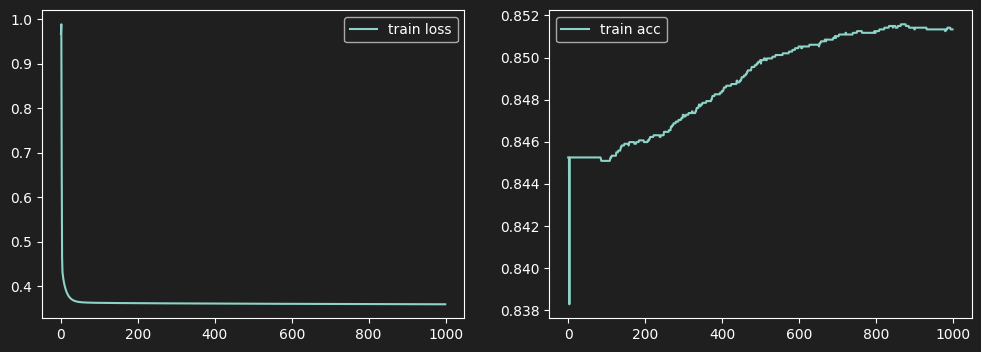

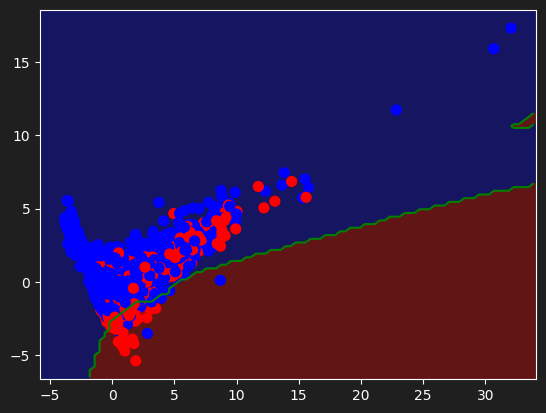

Accuracy: 0.851338199513382
Confusion Matrix:
[[10389    33]
 [ 1800   108]]
Error Rate: 0.14866180048661803
Classification Report:
              precision    recall  f1-score   support

           0       0.85      1.00      0.92     10422
           1       0.77      0.06      0.11      1908

    accuracy                           0.85     12330
   macro avg       0.81      0.53      0.51     12330
weighted avg       0.84      0.85      0.79     12330



In [245]:
training_history = Neural_Network(X, y, hidden_layers=(32, 32, 32), learning_rate=0.5, n_iter=1000)

<h1>Deepl Learning sans PCA</h1>

In [187]:
plt.style.use('dark_background')
plt.rcParams.update({
    "figure.facecolor": (0.12, 0.12, 0.12, 1),
    "axes.facecolor": (0.12, 0.12, 0.12, 1),
})

In [188]:
#Transformation de la data
X = data_for_classification_scaled.T
X = X.astype(np.float64)
y = target.to_numpy().reshape((1, target.shape[0]))

In [189]:
#Vérification de la shape et de la class
print("X = ", X)
print(X.shape)
print(type(X))
print("y = ", y)
print(y.shape)
print(type(y))

X =  [[-0.69699296 -0.69699296 -0.69699296 ... -0.69699296  0.50722805
  -0.69699296]
 [-0.4571914  -0.4571914  -0.4571914  ... -0.4571914  -0.03291592
  -0.4571914 ]
 [-0.3964779  -0.3964779  -0.3964779  ... -0.3964779  -0.3964779
  -0.3964779 ]
 ...
 [-0.76262903 -0.51418219 -0.26573535 ...  2.21873304  1.72183936
  -0.51418219]
 [ 0.36581232  0.36581232  0.36581232 ...  0.36581232  0.36581232
  -2.43746048]
 [-0.55055169 -0.55055169 -0.55055169 ...  1.81635987 -0.55055169
   1.81635987]]
(17, 12330)
<class 'numpy.ndarray'>
y =  [[0 0 0 ... 0 0 0]]
(1, 12330)
<class 'numpy.ndarray'>


In [190]:
def Initialisation(dimensions):
    parametres = {}
    C = len(dimensions)
    
    for c in range(1, C):
        parametres['W' + str(c)] = np.random.randn(dimensions[c], dimensions[c - 1])
        parametres['b' + str(c)] = np.random.randn(dimensions[c], 1)

    return parametres

In [191]:
def Predict(X, parametres):
    activations = Forward_Propagation(X, parametres)
    C = len(parametres) // 2
    Af = activations['A' + str(C)]
    return Af >= 0.5

In [192]:
def Forward_Propagation(X, parametres):
    activations = {'A0' : X}
    C = len(parametres) // 2
    
    for c in range(1, C + 1):
        Z = parametres['W' + str(c)].dot(activations['A' + str(c - 1)]) + parametres['b' + str(c)]
        activations['A' + str(c)] = 1 / (1 + np.exp(-Z))
        
    return activations

In [193]:
def Back_Propagation(y, activations, parametres):
    
    m = y.shape[1]
    C = len(parametres) // 2
    
    dZ = activations['A' + str(C)] - y
    gradients = {}
    
    for c in reversed(range(1, C + 1)):
        gradients['dW' + str(c)] = 1 / m * np.dot(dZ, activations['A' + str(c - 1)].T)
        gradients['db' + str(c)] = 1 / m * np.sum(dZ, axis = 1, keepdims = True)
        if (c > 1):
            dZ = np.dot(parametres['W' + str(c)].T, dZ) * activations['A' + str(c - 1)] * (1 - activations['A' + str(c - 1)])
            
    return gradients

In [194]:
def Update(gradients, parametres, learning_rate):
    C = len(parametres) // 2
    
    for c in range(1, C + 1):
        parametres['W' + str(c)] = parametres['W' + str(c)] - learning_rate * gradients['dW' + str(c)]
        parametres['b' + str(c)] = parametres['b' + str(c)] - learning_rate * gradients['db' + str(c)]
        
    return parametres

In [195]:
def Neural_Network2(X, y, hidden_layers = (32, 32, 32), learning_rate = 0.1, n_iter = 1000):
    #Initialisation W, b
    dimensions = list(hidden_layers)
    dimensions.insert(0, X.shape[0])
    dimensions.append(y.shape[0])
    np.random.seed(1)
    parametres = Initialisation(dimensions)
    # tableau numpy contenant les futures accuracy et log_loss
    training_history = np.zeros((int(n_iter), 2))
    
    C = len(parametres) // 2
    
    for i in tqdm(range(n_iter)):
        
        activations = Forward_Propagation(X, parametres)
        gradients = Back_Propagation(y, activations, parametres)
        parametres = Update(gradients, parametres, learning_rate)
        Af = activations['A' + str(C)]

        # calcul du log_loss et de l'accuracy
        training_history[i, 0] = (log_loss(y.flatten(), Af.flatten()))
        y_pred = Predict(X, parametres)
        training_history[i, 1] = (accuracy_score(y.flatten(), y_pred.flatten()))
            
    # Plot courbe d'apprentissage
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(training_history[:, 0], label='train loss')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(training_history[:, 1], label='train acc')
    plt.legend()
    plt.show()

    y_pred = Predict(X, parametres)
    accuracy = accuracy_score(y.flatten(), y_pred.flatten())
    conf_matrix = confusion_matrix(y.flatten(), y_pred.flatten())
    error_rate = 1 - accuracy
    class_report = classification_report(y.flatten(), y_pred.flatten())

    print(f'Accuracy: {accuracy}')
    print(f'Confusion Matrix:\n{conf_matrix}')
    print(f'Error Rate: {error_rate}')
    print(f'Classification Report:\n{class_report}')
        
    return training_history

<h3>On test d'autres paramètres, moins de couches, moins de neurones, mais un learning rate plus élevé pour converger plus vite mais on a des difficultés à atteindre l'optimum (cf train acc)</h3>

100%|████████████████████████████████████████████████████████████████████████████| 10000/10000 [05:29<00:00, 30.39it/s]


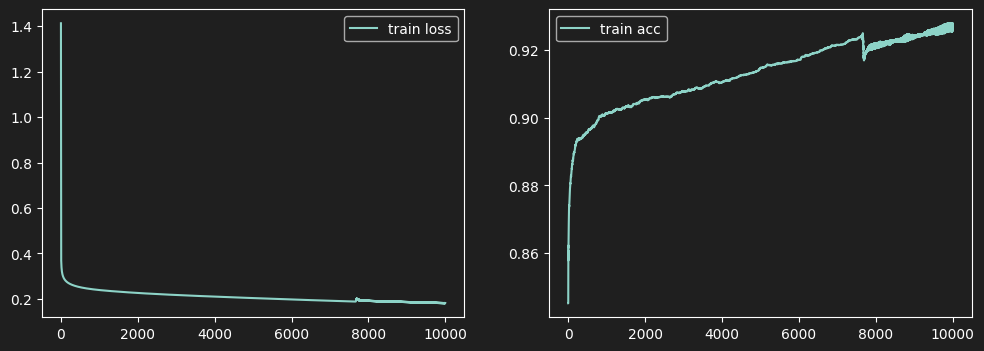

Accuracy: 0.9278183292781833
Confusion Matrix:
[[9999  423]
 [ 467 1441]]
Error Rate: 0.0721816707218167
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96     10422
           1       0.77      0.76      0.76      1908

    accuracy                           0.93     12330
   macro avg       0.86      0.86      0.86     12330
weighted avg       0.93      0.93      0.93     12330



In [227]:
training_history2 = Neural_Network2(X, y, hidden_layers=(32, 32), learning_rate=1, n_iter=10000)

### Conclusion, mon réseau de neurones sans PCA remporte la bataille avec :

Accuracy: 0.928

Confusion Matrix:<br>
[[9999   423]<br>
 [ 467  1441]]
 
Error Rate: 0.072

Classification Report:

                    precision   recall  f1-score   support

               0       0.96      0.96      0.96      10422
               1       0.77      0.76      0.76       1908

    accuracy                               0.93      12330
    macro avg          0.86      0.86      0.86      12330
    weighted avg       0.93      0.93      0.93      12330

<br>
En sachant que je n'ai clairement pas pris les meilleurs paramètres afin d'être plus rapide car on n'a pas que cela à faire.